<a href="https://colab.research.google.com/github/dianavalverdedelariviera/Asigntaura-S-S/blob/main/STEAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Proyecto Final Señales y Sistemas 2024 -2**
##**Diana Valverde De La Riviera**
###**1053807323**
## **Objetivo**: Implementar técnicas de representación en tiempo y frecuencia para el reconocimiento de señales de electroencefalografía (EEG) en tareas de imaginación motora (Motor Imagery)

![sensorimotora](https://nepsa.es/wp-content/uploads/2021/10/Lengua-Mandibula-Labios-Cara-Ojo-Frente-Cuello-Pulgar-Dedos-Mano-Muneca-Codo-Brazo-Hombro-Maletero-Cadera-3.png)

![eegMI](https://figures.semanticscholar.org/288a54f091264377eccc99a19079c9387d66a78f/3-Figure2-1.png)

EEG signals can be noisy from a number of sources, including physiological artifacts and electromagnetic interference. They can also vary from person to person, which makes it harder to extract features and understand the signals. Additionally, this variability, influenced by genetic and cognitive factors, presents challenges for developing subject-independent solutions.

**Base de datos**: GiGaScience Database [https://gigadb.org/dataset/100295](https://gigadb.org/dataset/100295)

Ver Sección 3.1 en [Multimodal Explainability Using Class Activation Maps and Canonical Correlation for MI-EEG Deep Learning Classification](https://www.mdpi.com/2076-3417/14/23/11208)


## Instalamos las librerias necesarias

## **EJERCICIO 1**
###**Consultar para qué sirven las siguientes librerías**1

###**Desarrollo ejercicio 1:**

1. **TensorFlow 2.15.0**: Es una biblioteca de aprendizaje automático utilizada para construir y entrenar redes neuronales. En el contexto del EEG, permite implementar modelos de deep learning para clasificar o analizar señales cerebrales.

2. **MNE 1.6.0**: Es una librería especializada en el análisis y procesamiento de señales EEG y MEG. Facilita la carga de datos, el filtrado, la segmentación y la visualización de señales cerebrales.

3. **Braindecode 0.7**: Es una librería basada en deep learning para el análisis de señales EEG. Proporciona modelos predefinidos y herramientas para entrenar redes neuronales en tareas como la clasificación de estados cerebrales.

4. **python-gcpds.databases**: Permite acceder a bases de datos del *Grupo de Computación y Procesamiento de Señales* (GCPDS), lo que facilita la carga de conjuntos de datos de EEG para entrenar y evaluar modelos.

In [ ]:
#!pip install tensorflow==2.15.0
!pip install mne==1.6.0
!pip install braindecode===0.7
!pip install -U git+https://github.com/UN-GCPDS/python-gcpds.databases

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 51.9 MB/s eta 0:00:00
  Attempting uninstall: mne
    Found existing installation: mne 1.9.0
    Uninstalling mne-1.9.0:
      Successfully uninstalled mne-1.9.0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.4/184.4 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.9/228.9 kB 9.3 MB/s eta 0:00:00
  Cloning https://github.com/UN-GCPDS/python-gcpds.databases to /tmp/pip-req-build-edok40kb
  Running command git clone --filter=blob:none --quiet https://github.com/UN-GCPDS/python-gcpds.databases /tmp/pip-req-build-edok40kb
  Resolved https://github.com/UN-GCPDS/python-gcpds.databases to commit d174df9958b6638156dcfe03996a6307e631a6a2
  Preparing metadata (setup.py) ... done
  Created wheel for gcpds-databases: filename=gcpds_databases-0.2-py3-none-any.whl size=32972807 sha256=adfe2a88ac04ceee03ee689d0201781a1e8be05a41685045a3b87278565abe2c
  Stored in directory: /tmp/pip-ephem-wheel-cache-to23a8kk/wheels/8e/66/a7

## Importamos algunas librerias necesarias

In [ ]:
from scipy.signal import resample
from scipy.signal import freqz, filtfilt, resample
from scipy.signal import butter as bw
import pandas as pd
import random
import numpy as np
import matplotlib.pyplot as plt
#import tensorflow as tf
from gcpds.databases import GIGA_MI_ME
from sklearn.base import BaseEstimator, TransformerMixin

## Funciones necesarias para el preprocesamiento leve de los datos

In [ ]:
def load_GIGA(db,
              sbj,
              eeg_ch_names,
              new_fs,
              fs,
              f_bank=None,
              vwt=None,
              run=None):

    index_eeg_chs = db.format_channels_selectors(channels = eeg_ch_names) - 1

    #tf_repr = TimeFrequencyRpr(sfreq = fs, f_bank = f_bank, vwt = vwt)

    db.load_subject(sbj)
    if run == None:
        X, y = db.get_data(classes = ['left hand mi', 'right hand mi']) #Load MI classes, all channels {EEG}, reject bad trials, uV
    else:
        X, y = db.get_run(run, classes = ['left hand mi', 'right hand mi']) #Load MI classes, all channels {EEG}, reject bad trials, uV
    X = X[:, index_eeg_chs, :] #spatial rearrangement
    #X = np.squeeze(tf_repr.transform(X))
    #Resampling
    if new_fs == fs:
        pass#print('No resampling, since new sampling rate same.')
    else:
        print("Resampling from {:f} to {:f} Hz.".format(fs, new_fs))
        X = resample(X, int((X.shape[-1]/fs)*new_fs), axis = -1)

    return X, y

def butterworth_digital_filter(X, N, Wn, btype, fs, axis=-1, padtype=None, padlen=0, method='pad', irlen=None):
  """
  Apply digital butterworth filter
  INPUT
  ------
  1. X: (D array)
    array with signals.
  2. N: (int+)
    The order of the filter.
  3. Wn: (float+ or 1D array)
    The critical frequency or frequencies. For lowpass and highpass filters, Wn is a scalar; for bandpass and bandstop filters, Wn is a length-2 vector.
    For a Butterworth filter, this is the point at which the gain drops to 1/sqrt(2) that of the passband (the “-3 dB point”).
    If fs is not specified, Wn units are normalized from 0 to 1, where 1 is the Nyquist frequency (Wn is thus in half cycles / sample and defined as 2*critical frequencies / fs). If fs is specified, Wn is in the same units as fs.
  4. btype: (str) {‘lowpass’, ‘highpass’, ‘bandpass’, ‘bandstop’}
    The type of filter
  5. fs: (float+)
    The sampling frequency of the digital system.
  6. axis: (int), Default=1.
    The axis of x to which the filter is applied.
  7. padtype: (str) or None, {'odd', 'even', 'constant'}
    This determines the type of extension to use for the padded signal to which the filter is applied. If padtype is None, no padding is used. The default is ‘odd’.
  8. padlen: (int+) or None, Default=0
    The number of elements by which to extend x at both ends of axis before applying the filter. This value must be less than x.shape[axis] - 1. padlen=0 implies no padding.
  9. method: (str), {'pad', 'gust'}
    Determines the method for handling the edges of the signal, either “pad” or “gust”. When method is “pad”, the signal is padded; the type of padding is determined by padtype
    and padlen, and irlen is ignored. When method is “gust”, Gustafsson’s method is used, and padtype and padlen are ignored.
  10. irlen: (int) or None, Default=nONE
    When method is “gust”, irlen specifies the length of the impulse response of the filter. If irlen is None, no part of the impulse response is ignored.
    For a long signal, specifying irlen can significantly improve the performance of the filter.
  OUTPUT
  ------
  X_fil: (D array)
    array with filtered signals.
  """
  b, a = bw(N, Wn, btype, analog=False, output='ba', fs=fs)
  return filtfilt(b, a, X, axis=axis, padtype=padtype, padlen=padlen, method=method, irlen=irlen)

class TimeFrequencyRpr(BaseEstimator, TransformerMixin):
  """
  Time frequency representation of EEG signals.

  Parameters
  ----------
    1. sfreq:  (float) Sampling frequency in Hz.
    2. f_bank: (2D array) Filter banks Frequencies. Default=None
    3. vwt:    (2D array) Interest time windows. Default=None
  Methods
  -------
    1. fit(X, y=None)
    2. transform(X, y=None)
  """
  def __init__(self, sfreq, f_bank=None, vwt=None):
    self.sfreq = sfreq
    self.f_bank = f_bank
    self.vwt = vwt
# ------------------------------------------------------------------------------

  def _validation_param(self):
    """
    Validate Time-Frequency characterization parameters.
    INPUT
    -----
      1. self
    ------
      2. None
    """
    if self.sfreq <= 0:
      raise ValueError('Non negative sampling frequency is accepted')


    if self.f_bank is None:
      self.flag_f_bank = False
    elif self.f_bank.ndim != 2:
      raise ValueError('Band frequencies have to be a 2D array')
    else:
      self.flag_f_bank = True

    if self.vwt is None:
      self.flag_vwt = False
    elif self.vwt.ndim != 2:
      raise ValueError('Time windows have to be a 2D array')
    else:
      self.flag_vwt = True

# ------------------------------------------------------------------------------
  def _filter_bank(self, X):
    """
    Filter bank Characterization.
    INPUT
    -----
      1. X: (3D array) set of EEG signals, shape (trials, channels, time_samples)
    OUTPUT
    ------
      1. X_f: (4D array) set of filtered EEG signals, shape (trials, channels, time_samples, frequency_bands)
    """
    X_f = np.zeros((X.shape[0], X.shape[1], X.shape[2], self.f_bank.shape[0])) #epochs, Ch, Time, bands
    for f in np.arange(self.f_bank.shape[0]):
      X_f[:,:,:,f] = butterworth_digital_filter(X, N=4, Wn=self.f_bank[f], btype='bandpass', fs=self.sfreq)
    return X_f

# ------------------------------------------------------------------------------
  def _sliding_windows(self, X):
    """
    Sliding Windows Characterization.
    INPUT
    -----
      1. X: (3D array) set of EEG signals, shape (trials, channels, time_samples)
    OUTPUT
    ------
      1. X_w: (4D array) shape (trials, channels, window_time_samples, number_of_windows)
    """
    window_lenght = int(self.sfreq*self.vwt[0,1] - self.sfreq*self.vwt[0,0])
    X_w = np.zeros((X.shape[0], X.shape[1], window_lenght, self.vwt.shape[0]))
    for w in np.arange(self.vwt.shape[0]):
        X_w[:,:,:,w] = X[:,:,int(self.sfreq*self.vwt[w,0]):int(self.sfreq*self.vwt[w,1])]
    return X_w

# ------------------------------------------------------------------------------
  def fit(self, X, y=None):
    """
    fit.
    INPUT
    -----
      1. X: (3D array) set of EEG signals, shape (trials, channels, time_samples)
      2. y: (1D array) target labels. Default=None
    OUTPUT
    ------
      1. None
    """
    pass

# ------------------------------------------------------------------------------
  def transform(self, X, y=None):
    """
    Time frequency representation of EEG signals.
    INPUT
    -----
      1. X: (3D array) set of EEG signals, shape (trials, channels, times)
    OUTPUT
    ------
      1. X_wf: (5D array) Time-frequency representation of EEG signals, shape (trials, channels, window_time_samples, number_of_windows, frequency_bands)
    """
    self._validation_param()     #Validate sfreq, f_freq, vwt

    #Avoid edge effects of digital filter, 1st:fbk, 2th:vwt
    if self.flag_f_bank:
        X_f = self._filter_bank(X)
    else:
        X_f = X[:,:,:,np.newaxis]

    if self.flag_vwt:
      X_wf = []
      for f in range(X_f.shape[3]):
        X_wf.append(self._sliding_windows(X_f[:,:,:,f]))
      X_wf = np.stack(X_wf, axis=-1)
    else:
      X_wf = X_f[:,:,:,np.newaxis,:]

    return X_wf

#plot eeg
def plot_eeg(X,tv,ax,channels,esp=2,title=None):
    # X in CH x Samples
    n_canales = X.shape[0]

    for ch in range(n_canales): # canales
            xx = X[ch]
            xx = xx - np.mean(xx)
            xx = xx/np.max(abs(xx))
            ax.plot(tv, xx +(ch * esp), label=channels[ch])  # Desplazamos cada canal para visualización
    ax.set_yticks(range(0, esp * n_canales, esp), channels)  # Etiquetas en el eje Y
    ax.set_xlabel("Tiempo [s]")
    ax.set_ylabel("Canales EEG [$\mu$V]")
    ax.set_title(title)
    ax.grid(True)
    ax.set_xlim([min(tv)-0.01,max(tv)+0.01])
    ax.set_ylim([-esp,n_canales*esp+0.01])







## Establecemos el protocolo de pruebas y la configuración del montaje EEG

Describir el protocolo de captura de datos y el montaje utilizado


![mi](https://www.mdpi.com/diagnostics/diagnostics-13-01122/article_deploy/html/images/diagnostics-13-01122-g001.png)
![montaje](https://www.mdpi.com/applsci/applsci-14-11208/article_deploy/html/images/applsci-14-11208-g001.png)

In [ ]:
channels = ['Fp1','Fpz','Fp2',
            'AF7','AF3','AFz','AF4','AF8',
            'F7','F5','F3','F1','Fz','F2','F4','F6','F8',
            'FT7','FC5','FC3','FC1','FCz','FC2','FC4','FC6','FT8',
            'T7','C5','C3','C1','Cz','C2','C4','C6','T8',
            'TP7','CP5','CP3','CP1','CPz','CP2','CP4','CP6','TP8',
            'P9','P7','P5','P3','P1','Pz','P2','P4','P6','P8','P10',
            'PO7','PO3','POz','PO4','PO8',
            'O1','Oz','O2',
            'Iz']

areas = {
    'Frontal': ['Fpz', 'AFz', 'Fz', 'FCz'],
    'Frontal Right': ['Fp2','AF4','AF8','F2','F4','F6','F8',],
    'Central Right': ['FC2','FC4','FC6','FT8','C2','C4','C6','T8','CP2','CP4','CP6','TP8',],
    'Posterior Right': ['P2','P4','P6','P8','P10','PO4','PO8','O2',],
    #'Central': ['Cz'],
    'Posterior': ['CPz','Pz', 'Cz','POz','Oz','Iz',],
    'Posterior Left': ['P1','P3','P5','P7','P9','PO3','PO7','O1',],
    'Central Left': ['FC1','FC3','FC5','FT7','C1','C3','C5','T7','CP1','CP3','CP5','TP7',],
    'Frontal Left': ['Fp1','AF3','AF7','F1','F3','F5','F7',],
}

arcs = [
    #'hemispheres',
    'areas',
    'channels',
]

## Definimos la ruta y los argumentos para la carga de los datos de EEG

In [ ]:
db = GIGA_MI_ME('/kaggle/input/giga-science-gcpds/GIGA_MI_ME')
#ti = 0
#tf = 7
new_fs = 256.
load_args = dict(db = db,
                 eeg_ch_names = channels,
                 fs = db.metadata['sampling_rate'],
                 #f_bank = np.asarray([[4., 40.]]),
                 #vwt = np.asarray([[ti, tf]]), #2.5 - 5 MI
                 new_fs = new_fs)

## Cargamos los datos según el sujeto que se quiera

Si se quiere cargar los datos de todos los sujetos, aplicar un ciclo que itere la lista de sujetos y de esta forma se cargara uno por uno dependiendo lo que se desee realizar.

Por ejemplo:

for i in sbj:
    X, y = load_GIGA(sbj=sbj, **load_args)

In [ ]:
sbj = 16
X, y = load_GIGA(sbj=sbj, **load_args)

Resampling from 512.000000 to 256.000000 Hz.


In [ ]:
print(f'X con {X.shape[0]} intentos; {X.shape[1]} canales; {X.shape[2]} muestras No. de segundos {X.shape[2]/new_fs}')

X con 199 intentos; 64 canales; 1792 muestras No. de segundos 7.0


In [ ]:
X.shape

(199, 64, 1792)

## Visualización de las señales de EEG en el tiempo

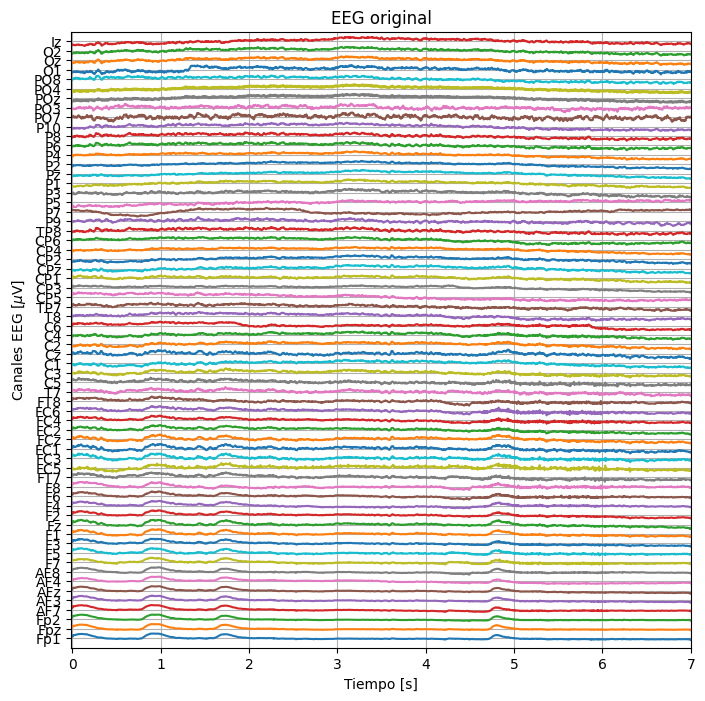

In [ ]:
#graficar canales promedio
trial = 0
ti = 0 # ti
tf = 7 # tf
tv = np.arange(ti,tf,1/new_fs)

#Señal cruda
fig,ax = plt.subplots(1,1,figsize=(8,8),sharex = True)
# Graficar cada canal en un subplot banda respectiva

plot_eeg(X[trial],tv,ax=ax,channels=channels,title='EEG original')
plt.show()

## **EJERCICIO 2**

###**Discuta la gráfica anterior**

La imagen representa un EEG crudo en múltiples canales a lo largo del tiempo. A partir de esta visualización, podemos deducir varias características clave sobre la señal y su calidad.

### **Evaluación de la Señal EEG Cruda**
La imagen muestra **señales multicanal** registradas desde distintos electrodos ubicados en el cuero cabelludo. En este estado sin procesar, se pueden identificar aspectos fundamentales:

- **Patrones de actividad oscilatoria**: Se observan oscilaciones que corresponden a la actividad neuronal en diferentes regiones del cerebro.
- **Distribución de la amplitud**: Algunas señales presentan mayor variabilidad que otras, lo que sugiere diferencias en la actividad cortical capturada por cada electrodo.
- **Presencia de artefactos**: Existen variaciones bruscas en ciertas partes de la señal, lo que puede indicar artefactos producidos por parpadeo, movimiento ocular, actividad muscular o interferencia electromagnética.

---

### **Necesidad de Preprocesamiento**
Dado que la señal EEG es altamente susceptible a interferencias externas y actividad no cerebral, es fundamental aplicar técnicas de preprocesamiento para mejorar su calidad. De esta imagen podemos deducir que se pueden requerir los siguientes pasos:

+ **Filtrado de la señal**  
+ **Detección y eliminación de artefactos**  
+ **Re-referenciación de la señal**  
+ **Normalización y segmentación**  


---

### **Deducción sobre la Actividad Cerebral**
Aunque la imagen no presenta análisis en frecuencia ni segmentación en bandas específicas, algunas observaciones pueden hacerse:

- **Actividad regular en la mayoría de los canales**: Sugiere un estado de reposo o baja estimulación cognitiva si no hay oscilaciones abruptas.
- **Presencia de oscilaciones en ciertas regiones**: Dependiendo de los electrodos, podrían representar actividad en diferentes bandas (delta, theta, alfa, beta, gamma).
- **Posibles patrones de sincronización/desincronización**: Si se compara con otros registros, se podrían identificar eventos neuronales significativos.

---


### **Conclusión**
La imagen representa un EEG en su forma original, permitiendo evaluar la calidad de la señal y la necesidad de aplicar técnicas de preprocesamiento. Antes de extraer información relevante sobre la actividad cerebral, se deben filtrar artefactos y segmentar las señales para un análisis en el dominio del tiempo o la frecuencia. Dependiendo del objetivo, técnicas como **análisis de componentes, extracción de características y modelos de machine learning** pueden ayudar a interpretar la actividad neuronal capturada en estos registros.


Nota: Recuerde el concepto de ritmos cerebrales

![montaje](https://cdn.shopify.com/s/files/1/0348/7053/files/storage.googleapis.com-486681944373284_61cb9936-f6c2-493d-8402-3426d7f5a049_1024x1024.jpg?v=1689309340)



In [ ]:
# filtramos trials completos en ritmos cerebrales utilizando filtros IIR


f_bank = np.array([[0.5,4.],[4., 8.],[8.,13.],[13.,32.],[32.,100.]])
vwt = np.asarray([[ti, tf]]) #2.5 - 5 MI 0 - 7 trial completo
tf_repr = TimeFrequencyRpr(sfreq = new_fs, f_bank = f_bank)

Xrc = np.squeeze(tf_repr.transform(X))

Xrc.shape

(199, 64, 1792, 5)

## **EJERCICIO 3**

###**Explique cómo se calcularon cada una de las 5 dimensiones del arreglo Xrc**

La clase **TimeFrequencyRpr** genera un arreglo de hasta cinco dimensiones con la siguiente estructura:

$
(N_{\text{trials}}, N_{\text{canales}}, N_{\text{muestras\_tiempo}}, N_{\text{ventanas}}, N_{\text{bandas\_frecuencia}})
$

Si alguna de estas dimensiones tiene tamaño 1 (por ejemplo, si solo hay una ventana de tiempo), la función `np.squeeze(Xrc)` elimina dicha dimensión, resultando en un arreglo de cuatro dimensiones.

### **Descripción de cada dimensión**
1. **Trials $(N_{\text{trials}}$)**: Representa la cantidad de ensayos o épocas registradas. Si, por ejemplo, se tienen 24 ensayos de imaginación motora, esta dimensión será 24.

2. **Canales $(N_{\text{canales}})$**: Corresponde al número de electrodos EEG utilizados en el experimento. En este caso, se emplean 64 canales, siguiendo el sistema 10-20 extendido.

3. **Muestras en el Tiempo $(N_{\text{muestras\_tiempo}})$**: Indica la cantidad de puntos de muestreo en cada ensayo. Si cada ensayo dura 7 segundos y la frecuencia de muestreo es de 256 Hz, entonces el número total de muestras es:
   $
   7 \times 256 = 1792
   $

4. **Ventanas de Tiempo $(N_{\text{ventanas}})$**: Se refiere a la segmentación temporal aplicada a la señal. Si solo se usa una ventana de 0 a 7 segundos, esta dimensión será 1. Sin embargo, si el ensayo se divide en múltiples ventanas (por ejemplo, de 2 a 4 s y de 4 a 6 s), esta dimensión aumentará.

5. **Bandas de Frecuencia $(N_{\text{bandas\_frecuencia}})$**: Proviene del banco de filtros aplicado a la señal. Si se definen cinco bandas de frecuencia (delta, theta, alfa, beta y gamma), esta dimensión tendrá un tamaño de 5.

### **Transformación de la señal**
El método `transform` de la clase realiza dos operaciones clave:
- **Filtrado en bandas de frecuencia**, lo que añade una dimensión adicional para representar las distintas bandas.
- **Segmentación en ventanas de tiempo**, incorporando otra dimensión si se utilizan múltiples ventanas.


$
(N_{\text{trials}}, N_{\text{canales}}, N_{\text{muestras\_tiempo}}, N_{\text{bandas\_frecuencia}})
$


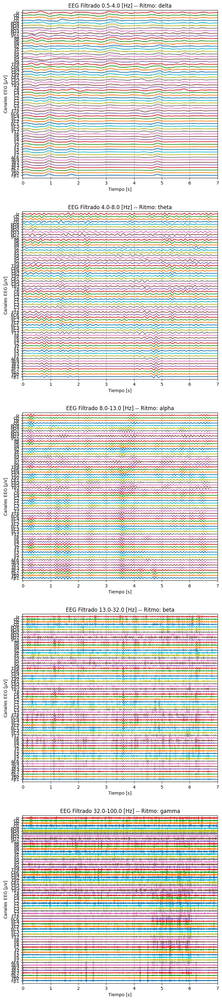

In [ ]:
import matplotlib.pyplot as plt

ritmo = ['delta','theta','alpha','beta','gamma']
trial = 0
n_trials, n_canales, n_muestras, n_bands = Xrc.shape  # Simulación de datos

esp = 2 #espaciado canales
fig,ax = plt.subplots(5,1,figsize=(8,40))
# Graficar cada canal en un subplot banda respectiva
for b in range(f_bank.shape[0]): #bandas
    plot_eeg(Xrc[trial,:,:,b],tv,ax=ax[b],channels=channels,title=f'EEG Filtrado {f_bank[b,0]}-{f_bank[b,1]} [Hz] -- Ritmo: {ritmo[b]}')
plt.show()

## Visualización de las señales de EEG en la frecuencia

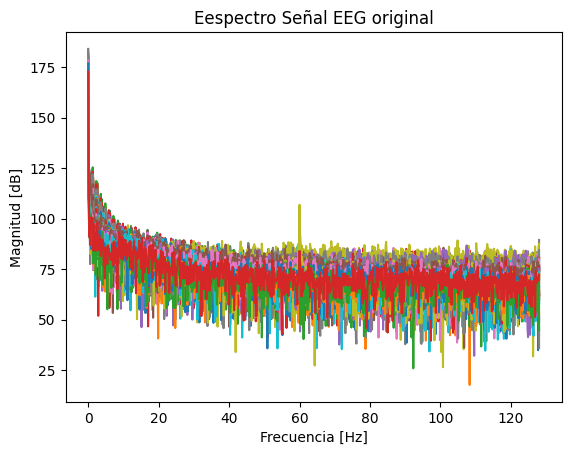

In [ ]:
#señal orignal
Xwo = np.fft.rfft(X,axis=-1)
vfreq = np.fft.rfftfreq(X.shape[2],1/new_fs)

Xwo.shape
plt.plot(vfreq,20*np.log10(np.abs(Xwo[trial])).T)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Magnitud [dB]')
plt.title('Eespectro Señal EEG original')
plt.show()


## **EJERCICIO 4**

###**Discuta la gráfica anterior**

La imagen representa el **espectro de la señal EEG original**, lo que nos permite analizar el contenido en frecuencia de la señal y evaluar su calidad antes de cualquier procesamiento.


### **Distribución del Espectro de Potencia**
- La gráfica muestra la **magnitud en decibeles (dB)** en función de la **frecuencia en Hz**.
- Se observa un **pico significativo en bajas frecuencias**, lo que indica que la mayor parte de la energía de la señal EEG está concentrada en ese rango, lo cual es típico de la actividad cerebral.
- A medida que la frecuencia aumenta, la magnitud disminuye, lo que es esperable, ya que la mayor parte de la información relevante del EEG se encuentra en frecuencias bajas (por debajo de 50 Hz).


### **Presencia de Artefactos y Ruido**
- Se detecta un **pico notable en 60 Hz**, lo que sugiere la presencia de **ruido de la red eléctrica** (interferencia electromagnética común en registros EEG).
- También hay cierta dispersión en el espectro en frecuencias altas (>100 Hz), lo que podría estar asociado a **ruido de alta frecuencia**, posiblemente debido a actividad muscular (EMG) o interferencias externas.



### **Identificación de Bandas de Frecuencia**

- **Delta (0.5 - 4 Hz)**: Asociada a sueño profundo y estados inconscientes.
- **Theta (4 - 8 Hz)**: Relacionada con estados de relajación y sueño ligero.
- **Alpha (8 - 13 Hz)**: Presente en estados de calma y relajación con ojos cerrados.
- **Beta (13 - 30 Hz)**: Vinculada con actividad mental y concentración.
- **Gamma (>30 Hz)**: Asociada a procesos cognitivos avanzados.

En la gráfica, se ve que la mayor parte de la energía está en **frecuencias bajas** (0-30 Hz), lo que es característico del EEG, pero también hay ruido en frecuencias más altas.



### **Conclusión**
El espectro de la señal EEG muestra que la mayor parte de la información útil se encuentra en frecuencias bajas, pero también hay presencia de **ruido de línea eléctrica y alta frecuencia**. Para mejorar la calidad del análisis, sería recomendable aplicar técnicas de preprocesamiento que eliminen estas interferencias sin perder la información relevante del EEG.



In [ ]:
#espectro señales filtradas
Xwb = np.fft.rfft(Xrc,axis=2)

Xwb.shape

(199, 64, 897, 5)

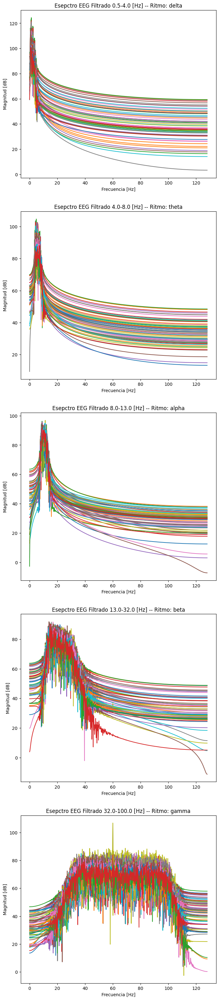

In [ ]:
#espectro señales filtradas por bandas - ritmos cerebrales

fig,ax = plt.subplots(5,1,figsize=(8,40))
# Graficar cada canal en un subplot banda respectiva
for b in range(f_bank.shape[0]): #bandas
    ax[b].plot(vfreq,20*np.log10(np.abs(Xwb[trial,:,:,b])).T)
    ax[b].set_xlabel('Frecuencia [Hz]')
    ax[b].set_ylabel('Magnitud [dB]')
    ax[b].set_title(f'Esepctro EEG Filtrado {f_bank[b,0]}-{f_bank[b,1]} [Hz] -- Ritmo: {ritmo[b]}')

plt.show()

## **EJERCICIO 5**

###**Discuta las gráficas**

Las gráficas muestran los **espectros de las señales EEG filtrada en diferentes bandas de frecuencia**, lo que permite analizar la actividad neuronal en distintas regiones del espectro. Se presentan cinco gráficos correspondientes a las bandas tradicionales del EEG:

+ **Ritmo Delta (0.5 - 4 Hz)**  
   - Se observa que la mayor parte de la energía está concentrada en frecuencias muy bajas.  
   - Estas oscilaciones están asociadas a estados de sueño profundo y procesos inconscientes.  
   - La magnitud disminuye rápidamente a medida que la frecuencia aumenta.

+ **Ritmo Theta (4 - 8 Hz)**  
   - Predominan frecuencias ligeramente más altas, pero sigue habiendo una concentración de energía en bajas frecuencias.  
   - Se relaciona con estados de relajación, meditación y sueño ligero.  

+ **Ritmo Alpha (8 - 13 Hz)**  
   - Se observa un pico más definido en el rango de 8-13 Hz, característico del ritmo alfa.  
   - Este ritmo es común en estados de calma con ojos cerrados y relajación mental.  

+ **Ritmo Beta (13 - 32 Hz)**  
   - La distribución de energía se amplía y muestra mayor variabilidad en la magnitud.  
   - Se relaciona con actividad cognitiva, concentración y estados de alerta.  
   - Es más prominente en tareas que requieren procesamiento mental activo.  

+ **Ritmo Gamma (32 - 100 Hz)**  
   - Presenta una distribución más uniforme en altas frecuencias, sin una caída abrupta.  
   - Se asocia con procesos cognitivos avanzados, percepción y consolidación de memoria.  
   - Se observa un pico cerca de los 60 Hz, posiblemente debido a interferencia de la red eléctrica.  

### **Conclusión**  
Esta segmentación en bandas de frecuencia permite estudiar la actividad cerebral en distintos estados y filtrar componentes no deseados. Se puede notar que la energía de la señal EEG se distribuye de manera diferente en cada rango de frecuencias, lo que confirma la importancia del análisis espectral para identificar patrones neuronales relevantes. Además, la interferencia en 60 Hz sugiere la necesidad de aplicar filtrado notch para mejorar la calidad de los datos.

## Visualización de espectrogramas

Consultar Short Time Fourier Transform



(199, 64, 65, 29)


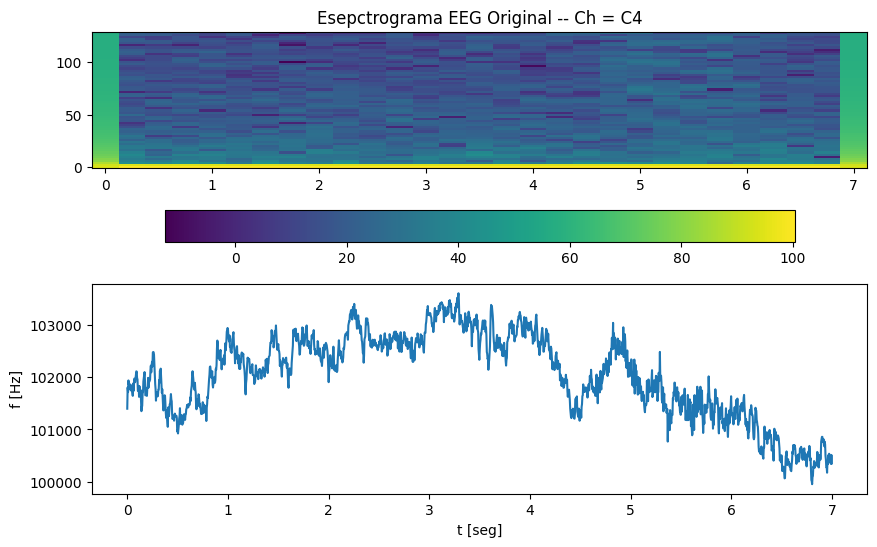

In [ ]:
from scipy.signal import stft
import matplotlib.pyplot as plt

# Parámetros para la STFT
nperseg = 0.5 * new_fs  # Duración de la ventana en muestras (0.5 segundos)

# Estimar STFT con ventanas de nperseg puntos sobre el eje temporal en EEG original
b = 2  # Índice de la banda de interés
vfs, t, Xstftb = stft(Xrc, fs=new_fs, nperseg=nperseg, axis=2)  # Calcular STFT
Xstftb = 20 * np.log10(abs(Xstftb))  # Convertir la magnitud a escala logarítmica en dB

print(Xstftb.shape)  # Verificar la dimensión de la matriz resultante

# Graficar STFT para un ensayo específico y un canal de interés
trail = 0  # Índice del ensayo
chi = channels.index('C4')  # Índice del canal seleccionado

# Crear figura con dos subgráficos
fig, ax = plt.subplots(2, 1, figsize=(10, 6))

# Graficar la señal EEG en el dominio del tiempo
ax[1].plot(tv, X[trail, chi, :], color='darkblue')  # Cambio de color de la línea
ax[1].set_ylabel("Amplitud [$\mu$V]")
ax[1].set_xlabel('Tiempo [s]')

# Graficar el espectrograma de la señal EEG
im = ax[0].pcolormesh(t, vfs, Xstftb[trail, chi], cmap='inferno')  # Cambio de colormap
fig.colorbar(im, ax=ax[0], orientation="horizontal", pad=0.2)  # Agregar barra de color
ax[0].set_ylabel('Frecuencia [Hz]')
ax[0].set_title(f'Espectrograma EEG Original -- Canal: {channels[chi]}')

plt.show()

(199, 64, 65, 5, 29)


Text(0.5, 1.0, 'Esepctrograma EEG Filtrado 8.0-13.0 [Hz] -- Ritmo: alpha -- Ch = C4')

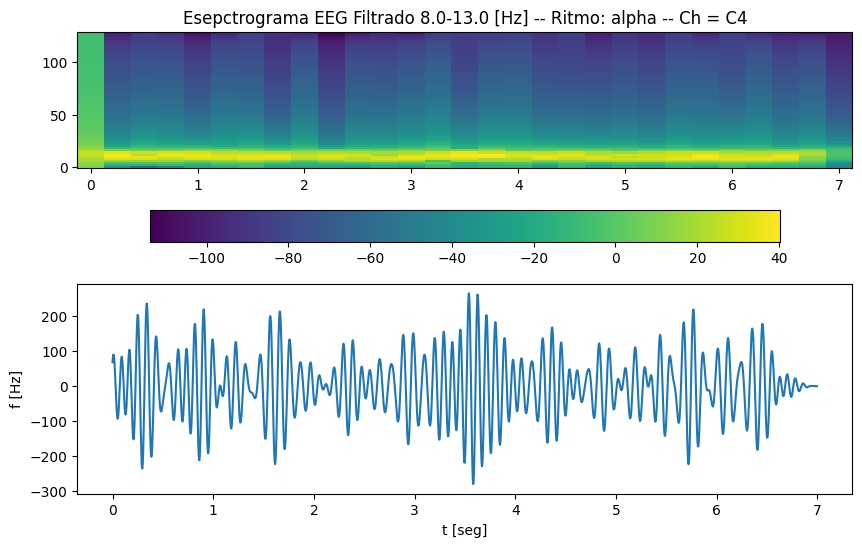

In [ ]:
# Estimar STFT con ventanas de nperseg puntos sobre el eje temporal en EEG original
b = 2  # Índice de la banda de interés
vfs, t, Xstftb = stft(Xrc, fs=new_fs, nperseg=nperseg, axis=2)  # Calcular STFT
Xstftb = 20 * np.log10(abs(Xstftb))  # Convertir la magnitud a escala logarítmica en dB

print(Xstftb.shape)  # Verificar la dimensión de la matriz resultante

# Crear figura con dos subgráficos
fig, ax = plt.subplots(2, 1, figsize=(10, 6))

# Graficar la señal EEG en el dominio del tiempo
ax[1].plot(tv, Xrc[trail, chi, :, b], color='darkblue')  # Cambio de color
ax[1].set_ylabel("Amplitud [$\mu$V]")
ax[1].set_xlabel('Tiempo [s]')

# Graficar el espectrograma de la señal EEG
im = ax[0].pcolormesh(t, vfs, Xstftb[trail, chi, :, b, :], cmap='inferno')  # Cambio de color
fig.colorbar(im, ax=ax[0], orientation="horizontal", pad=0.2)  # Agregar barra de color
ax[0].set_ylabel('Frecuencia [Hz]')
ax[0].set_title(f'Espectrograma EEG Filtrado {f_bank[b, 0]}-{f_bank[b, 1]} [Hz] -- Ritmo: {ritmo[b]} -- Canal: {channels[chi]}')

plt.show()


## **EJERCICIO 6**

###**Presente las gráficas de stft para distintos canales en los 5 ritmos cerebrales y discuta.**

Procesando ritmo: delta (0.5-4.0 Hz)


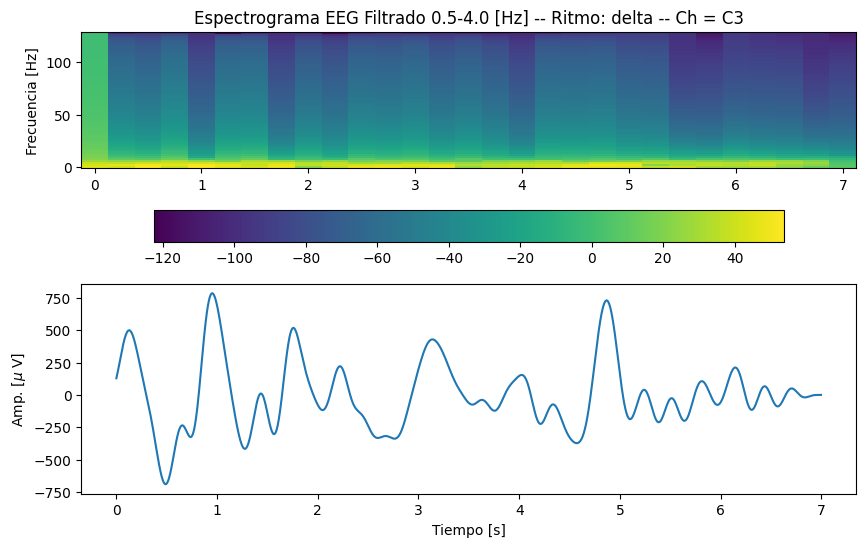

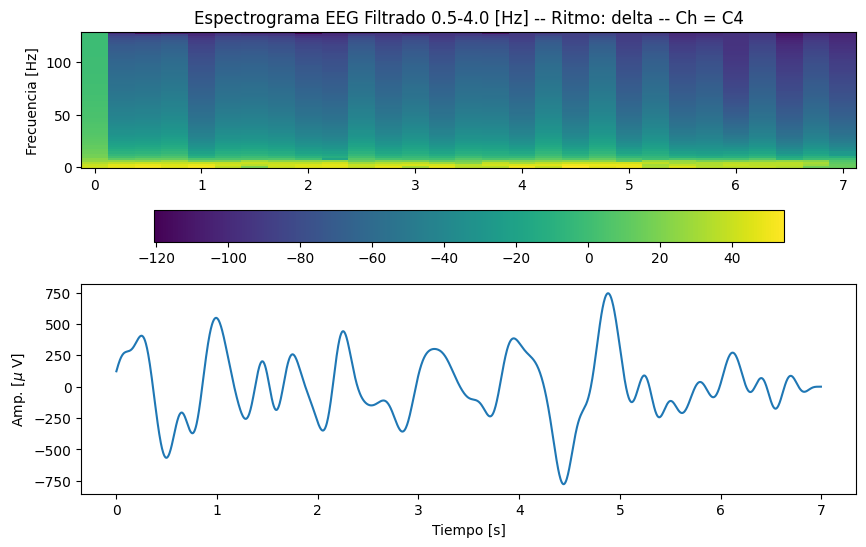

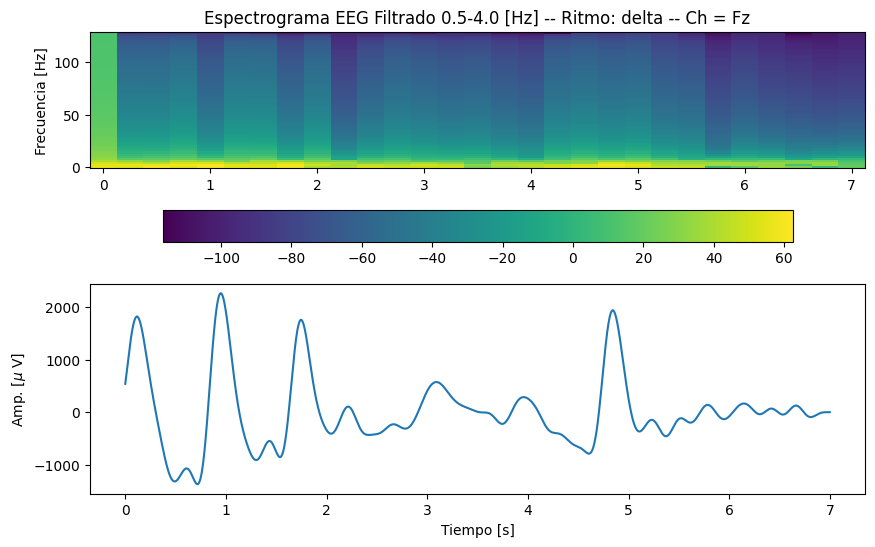

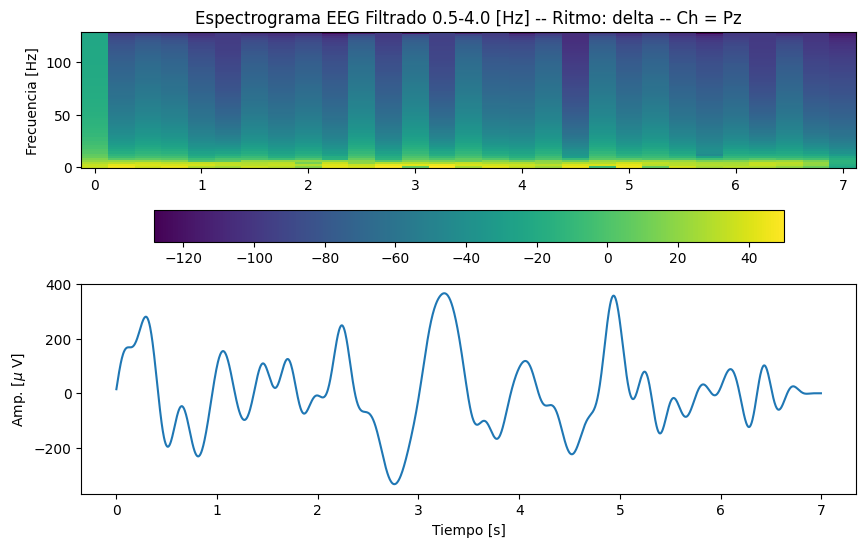

Procesando ritmo: theta (4.0-8.0 Hz)


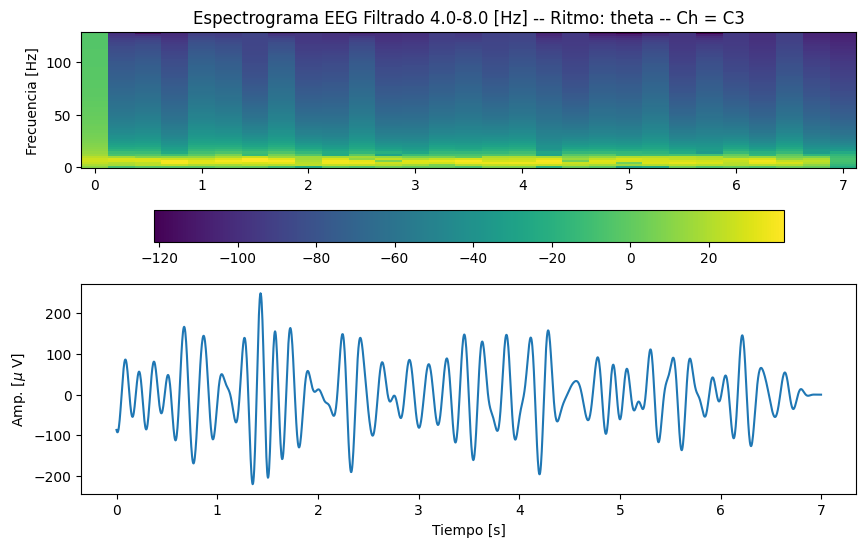

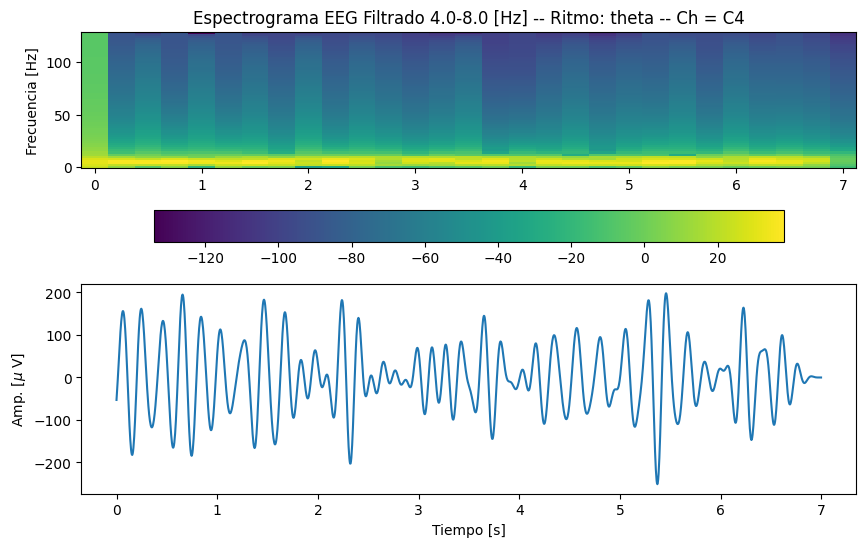

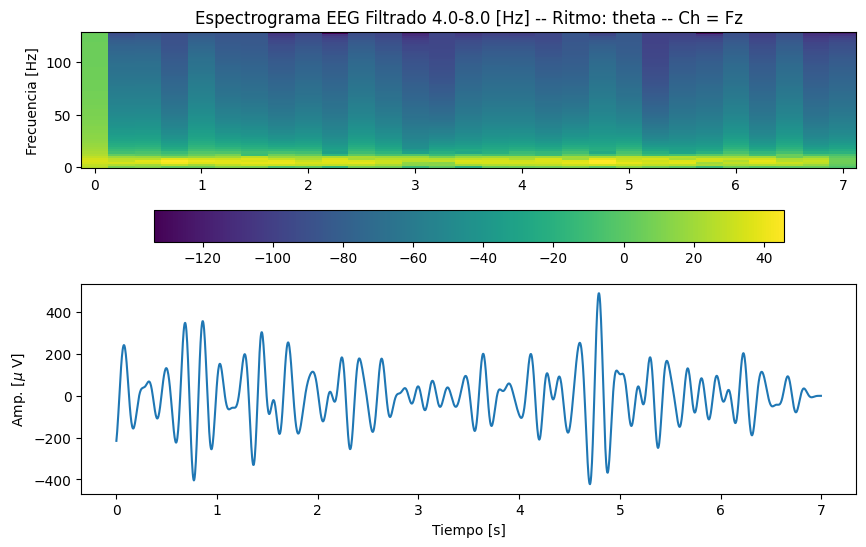

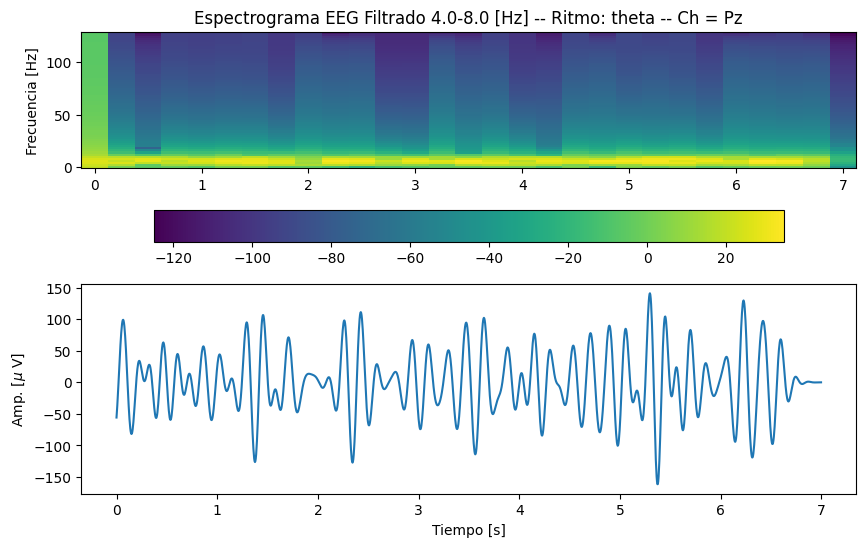

Procesando ritmo: alpha (8.0-13.0 Hz)


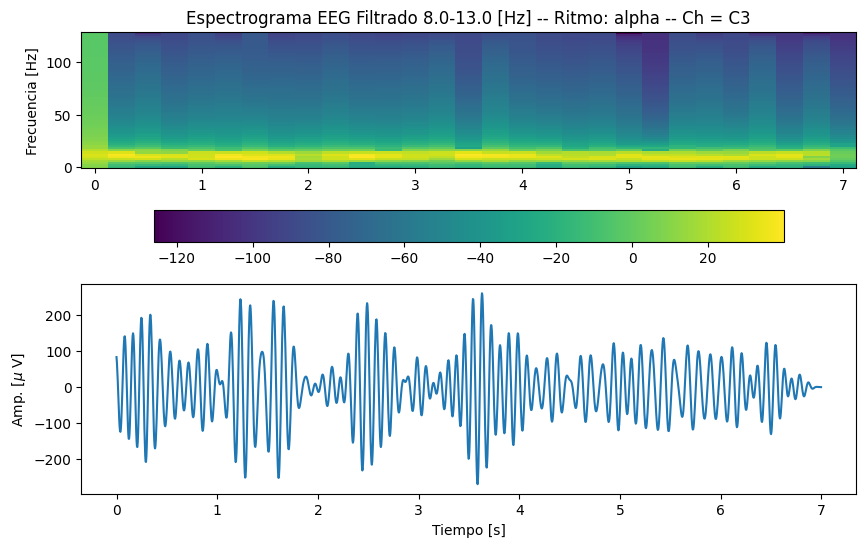

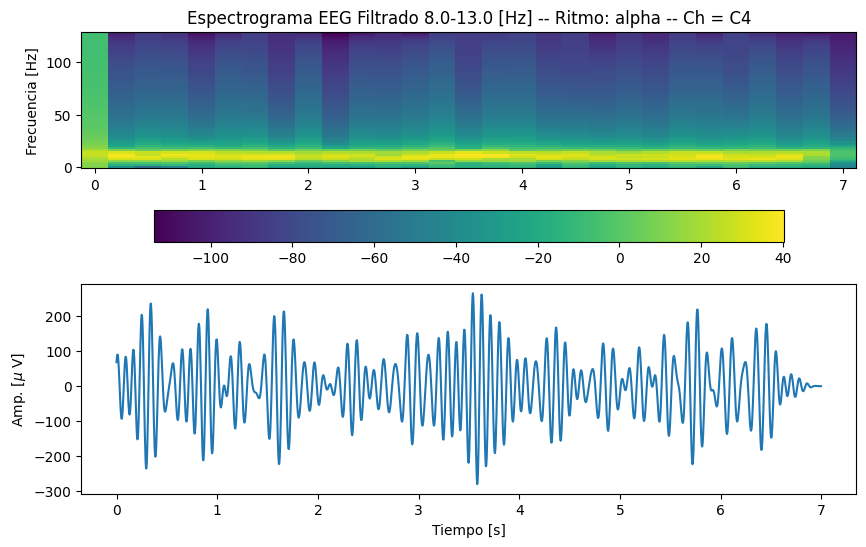

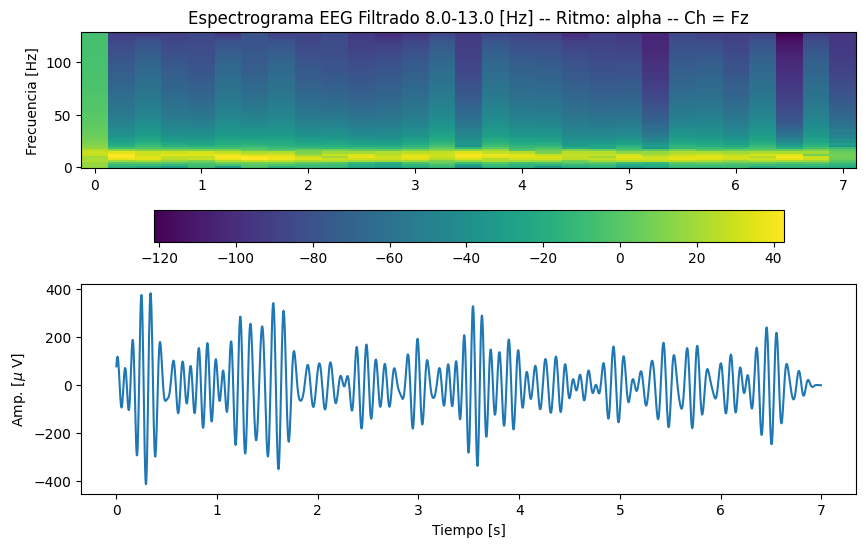

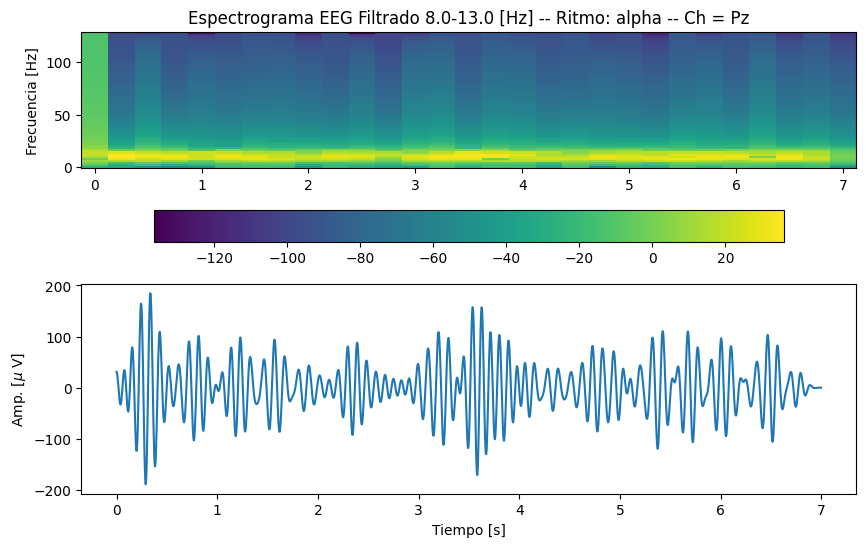

Procesando ritmo: beta (13.0-32.0 Hz)


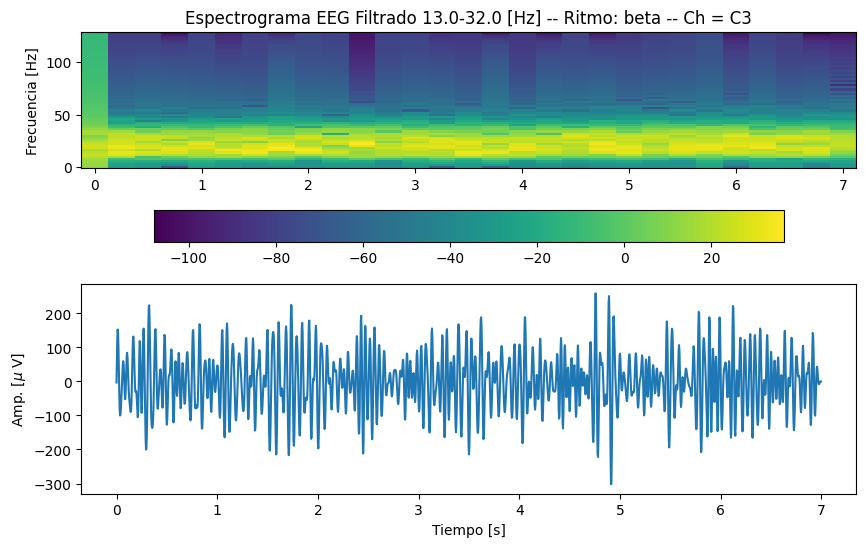

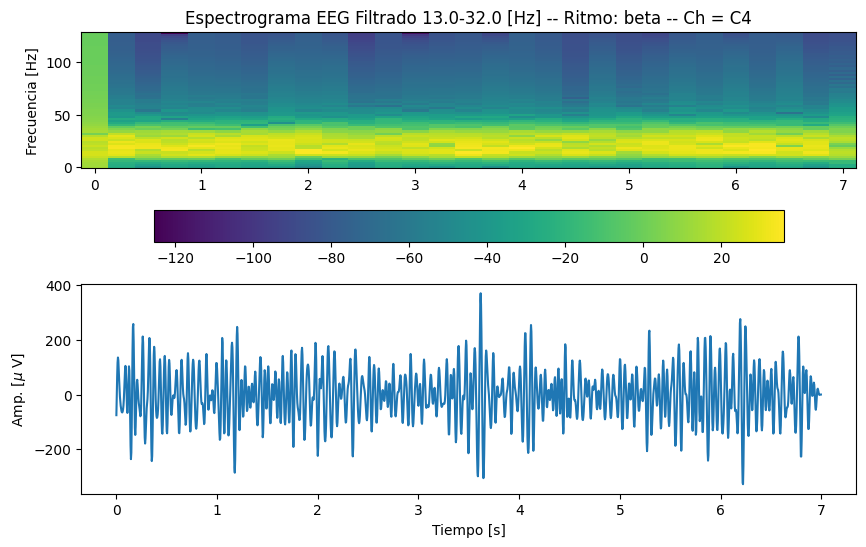

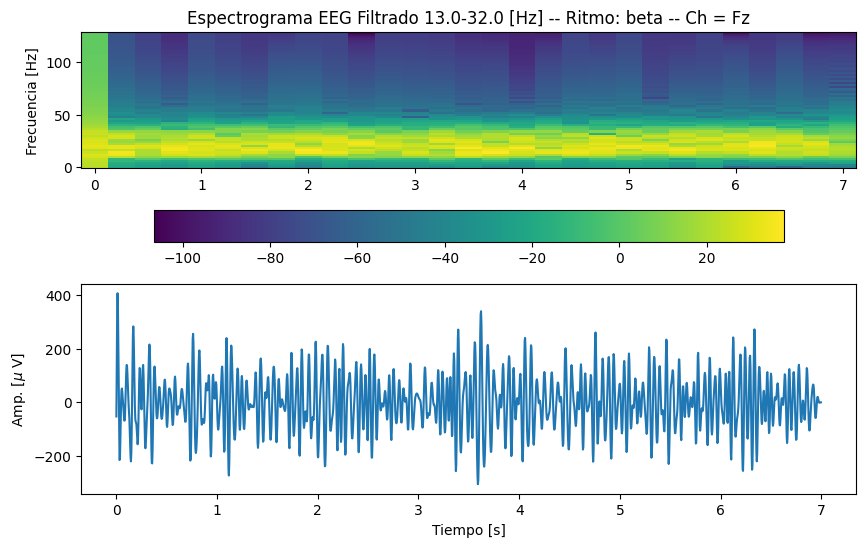

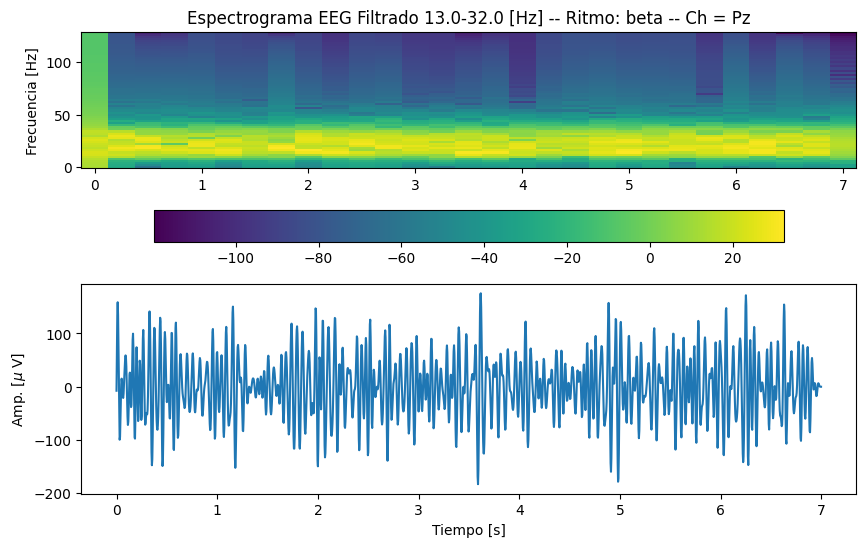

Procesando ritmo: gamma (32.0-100.0 Hz)


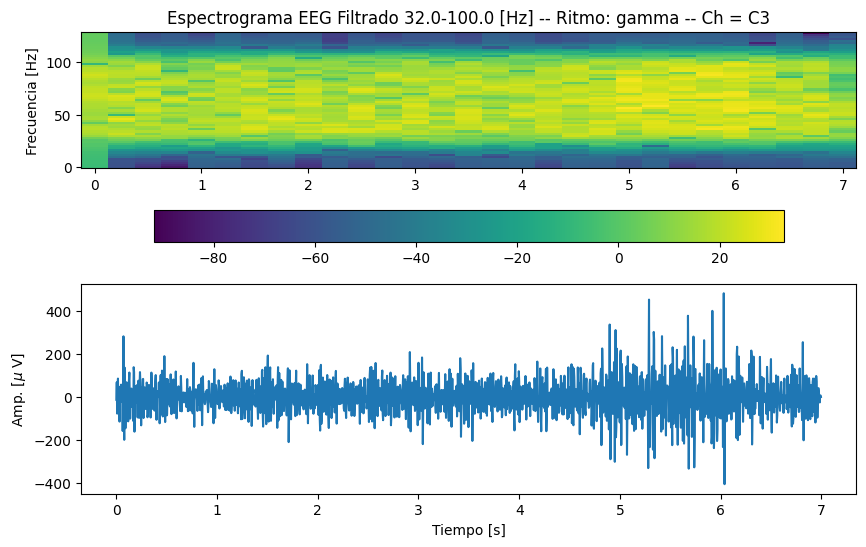

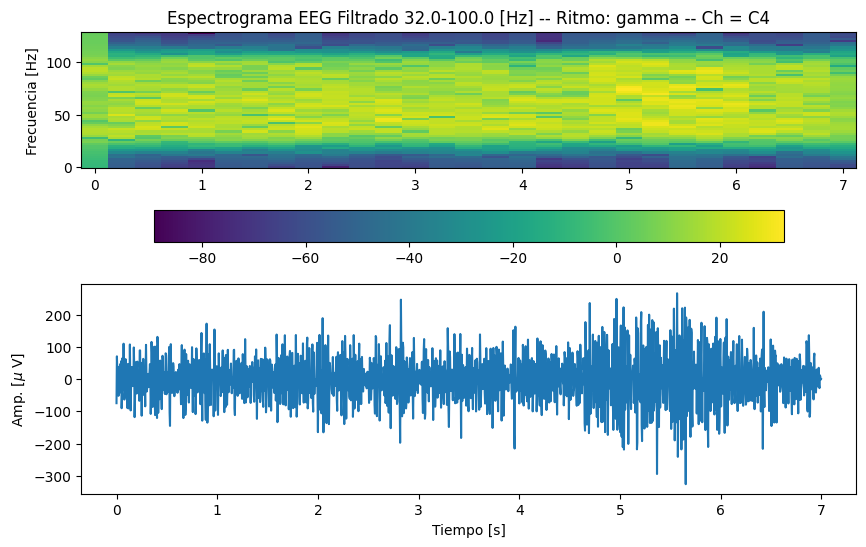

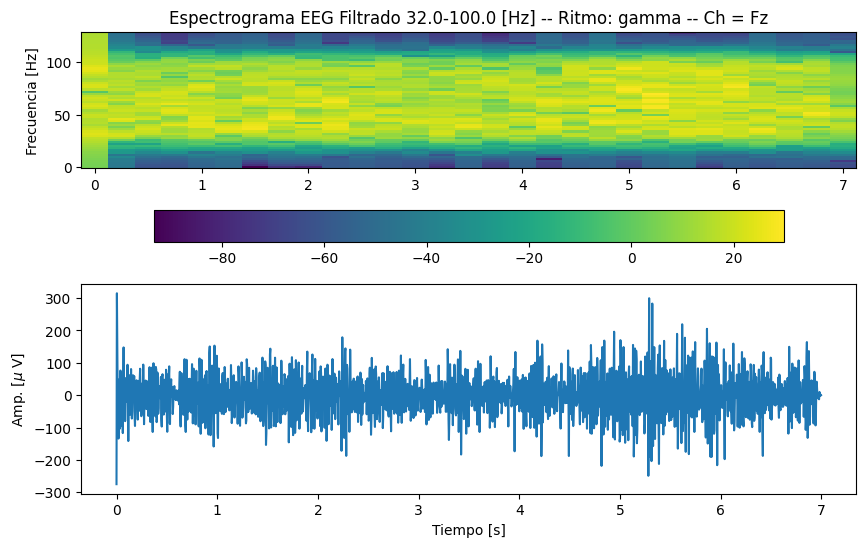

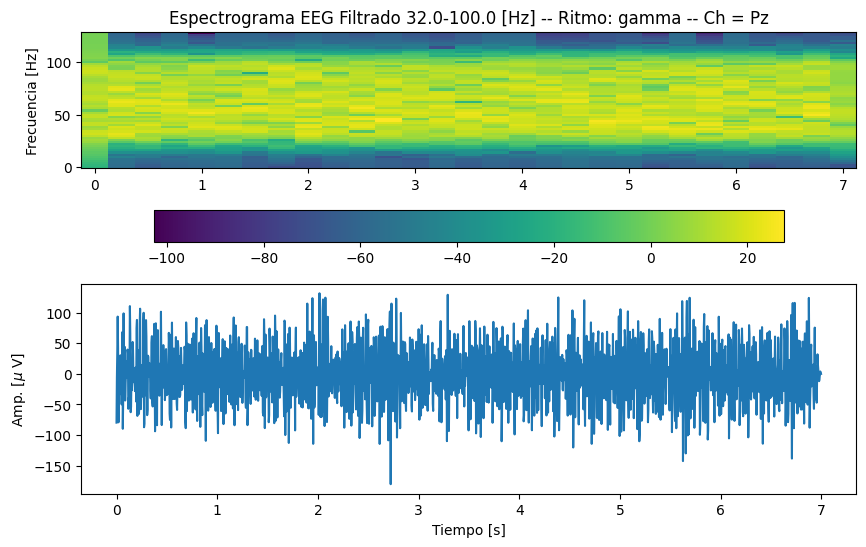

In [ ]:
canales_interes = ['C3', 'C4', 'Fz', 'Pz']
indices_canales = [channels.index(ch) for ch in canales_interes]

from scipy.signal import stft
import matplotlib.pyplot as plt

# Parámetros para la STFT
nperseg = 0.5 * new_fs  # Duración de la ventana en muestras (0.5 segundos)

# Iterar sobre las bandas de frecuencia
for b, ritmo_nombre in enumerate(ritmo):
    print(f"Procesando banda de frecuencia: {ritmo_nombre} ({f_bank[b, 0]}-{f_bank[b, 1]} Hz)")

    # Calcular la Transformada de Fourier de Tiempo Corto (STFT) para la banda actual
    vfs, t, Xstftb = stft(Xrc[:, :, :, b], fs=new_fs, nperseg=nperseg, axis=2)
    Xstftb = 20 * np.log10(abs(Xstftb))  # Convertir magnitud a dB

    # Graficar para cada canal seleccionado
    for ch_nombre, ch_idx in zip(canales_interes, indices_canales):
        fig, ax = plt.subplots(2, 1, figsize=(10, 6))

        # Espectrograma en la parte superior
        im = ax[0].pcolormesh(t, vfs, Xstftb[trail, ch_idx], cmap='inferno')  # Cambio de color
        fig.colorbar(im, ax=ax[0], orientation="horizontal", pad=0.2)
        ax[0].set_title(f'Espectrograma EEG Filtrado {f_bank[b, 0]}-{f_bank[b, 1]} [Hz] - {ritmo_nombre} - Canal: {ch_nombre}')
        ax[0].set_ylabel('Frecuencia [Hz]')

        # Señal temporal en la parte inferior
        ax[1].plot(tv, Xrc[trail, ch_idx, :, b], color='darkblue')  # Cambio de color de línea
        ax[1].set_ylabel("Amplitud [$\mu$V]")
        ax[1].set_xlabel('Tiempo [s]')

        plt.show()


Las gráficas de **STFT** obtenidas permiten analizar la actividad EEG en las cinco bandas de frecuencia principales: **delta, theta, alpha, beta y gamma**.

Gracias a los **espectrogramas**, podemos visualizar cómo la actividad en cada banda varía en el tiempo y su distribución en distintas regiones del cerebro. Esto facilita la interpretación de qué áreas estuvieron más activas en determinados momentos y cómo se relacionan con los estados del sujeto.  

### **Análisis por bandas de frecuencia**  

- **Delta (0.5-4 Hz):** En **C3 y C4**, su presencia es baja en vigilia, pero si aparece actividad significativa, podría indicar relajación extrema o sueño profundo. En **Fz y Pz**, sugiere fatiga o estados de descanso profundo.  
- **Theta (4-8 Hz):** En **C3 y C4**, aparece en momentos de somnolencia o relajación. En **Fz**, se asocia con la atención y la meditación, mientras que en **Pz**, puede estar relacionada con el procesamiento emocional.  
- **Alpha (8-13 Hz):** En **C3 y C4**, se observa en estados de relajación, especialmente con ojos cerrados. En **Fz y Pz**, refleja desconexión del entorno e integración sensorial.  
- **Beta (13-32 Hz):** En **C3 y C4**, se vincula con alerta y preparación para el movimiento. En **Fz**, con concentración y resolución de problemas, mientras que en **Pz**, con el procesamiento sensorial.  
- **Gamma (32-100 Hz):** En **C3 y C4**, está relacionada con la planificación motora. En **Fz**, con la atención y memoria de trabajo, y en **Pz**, con la integración multisensorial.  

## Visualización de señales EEG sobre montaje 10-20

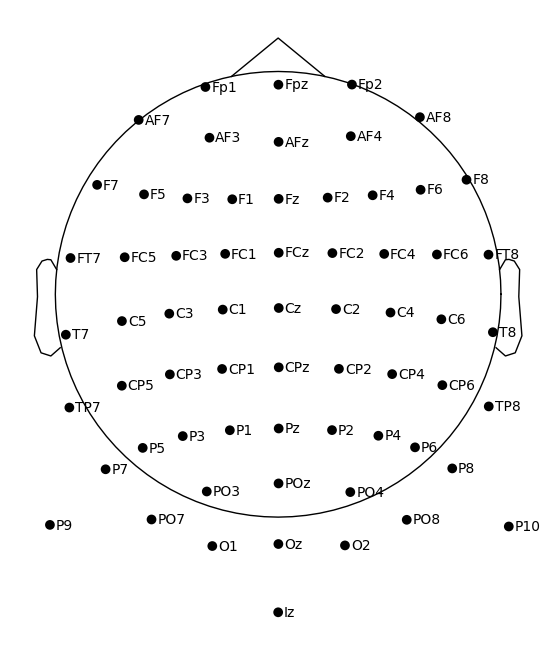

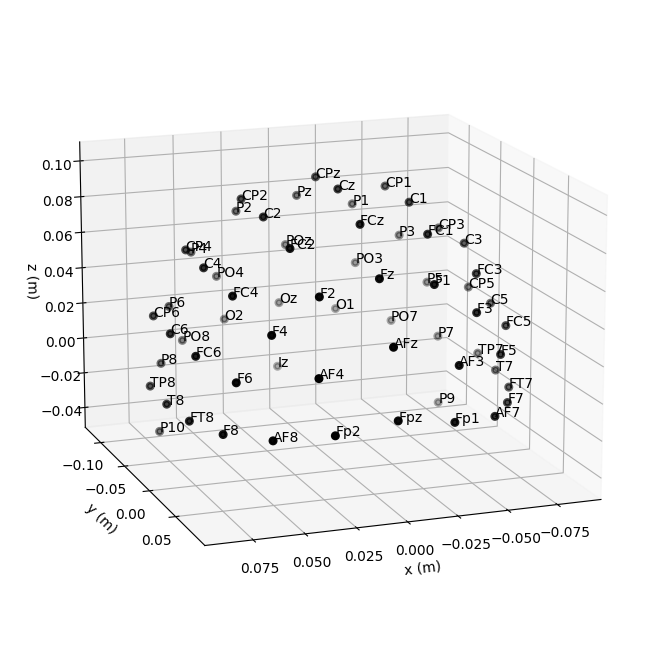

In [ ]:
import mne

# Cargar el montaje estándar
easycap_montage = mne.channels.make_standard_montage("standard_1020")


# Crear un montaje personalizado con los electrodos seleccionados
custom_pos = {ch: easycap_montage.get_positions()["ch_pos"][ch] for ch in channels}
custom_montage = mne.channels.make_dig_montage(ch_pos=custom_pos, coord_frame="head")

# Mostrar el montaje personalizado
custom_montage.plot(show_names=True)
fig = custom_montage.plot(kind="3d", show_names=True, show=False)
fig.gca().view_init(azim=70, elev=15)  # Ajustar la vista 3D

In [ ]:
!pip install -U git+https://github.com/UN-GCPDS/python-gcpds.visualizations.git

  Cloning https://github.com/UN-GCPDS/python-gcpds.visualizations.git to /tmp/pip-req-build-53b5ie6v
  Running command git clone --filter=blob:none --quiet https://github.com/UN-GCPDS/python-gcpds.visualizations.git /tmp/pip-req-build-53b5ie6v
  Resolved https://github.com/UN-GCPDS/python-gcpds.visualizations.git to commit 162dbeac141a7472d3b0bd7f005932241b4663a5
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 32.2 MB/s eta 0:00:00
  Created wheel for gcpds-visualizations: filename=gcpds_visualizations-0.6-py3-none-any.whl size=12439 sha256=82025d78c3a00386f2f1edb6354a6c024002915b305c9cb7a2920011d028e0d7
  Stored in directory: /tmp/pip-ephem-wheel-cache-_bx7ntgf/wheels/fa/f8/e8/78c4b4940a8349e29d9199eee5e3c5f526123608864b3834af
Successfully built gcpds-visualizations


# Topomaps

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


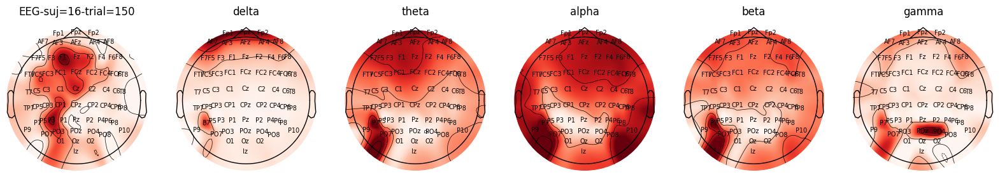

In [ ]:
from gcpds.visualizations.topoplots import topoplot


trial = 150
vec_topo_o = abs(X[trial,:]).mean(axis=-1)
vec_topo_b = abs(Xrc[trial,:,:,:]).mean(axis=1)


fig,ax = plt.subplots(1,6,figsize=(20,10))
topoplot(vec_topo_o, channels, contours=3, cmap='Reds', names=channels, sensors=False,ax=ax[0],show=False,vlim=(min(vec_topo_o), max(vec_topo_o)))

for b in range(f_bank.shape[0]):
    vec_ = vec_topo_b[:,b]
    topoplot(vec_, channels, contours=3, cmap='Reds', names=channels, sensors=False,ax=ax[b+1],show=False,vlim=(min(vec_), max(vec_)))
    ax[b+1].set_title(ritmo[b])

ax[0].set_title(f'EEG-suj={sbj}-trial={trial}')

plt.show()

## **EJERCICIO 7**

###**Discuta**

 Estos mapas permiten visualizar la intensidad de la actividad en distintas regiones del cuero cabelludo, facilitando la interpretación de patrones neuronales en función de la frecuencia.

### **Análisis por Banda de Frecuencia**
1. **Delta (0.5-4 Hz)**  
   - Se observa una mayor actividad en la región **frontal superior** y en la parte occipital izquierda.  
   - Las ondas delta suelen estar asociadas a estados de sueño profundo o fatiga.  

2. **Theta (4-8 Hz)**  
   - La actividad se concentra en la región **frontal y parieto-occipital**.  
   - Las ondas theta están vinculadas con la relajación, la memoria y la concentración.  

3. **Alpha (8-13 Hz)**  
   - Hay una activación más homogénea, con énfasis en las áreas **occipital y parietal**.  
   - Este patrón es característico de estados de relajación y atención pasiva, especialmente con los ojos cerrados.  

4. **Beta (13-32 Hz)**  
   - Se observa actividad en zonas **frontales y parietales**, con algunas concentraciones en áreas más específicas.  
   - Las ondas beta están relacionadas con la concentración, el procesamiento cognitivo y la actividad motora.  

5. **Gamma (32-100 Hz)**  
   - La mayor actividad se encuentra en la región **occipital y parietal**.  
   - Las ondas gamma se asocian con funciones cognitivas superiores, como la percepción y la consolidación de memoria.  





## Common Spatial Patterns

In [ ]:
import mne
from mne.decoding import CSP

# Instancia del objeto CSP
n_components = 2
csp = CSP(n_components=n_components, log= True, transform_into='average_power')
# Ajuste y transformación de los datos
csp_data = csp.fit_transform(X.astype(np.float64), y)

CSP Transformado Shape: (199, 2)


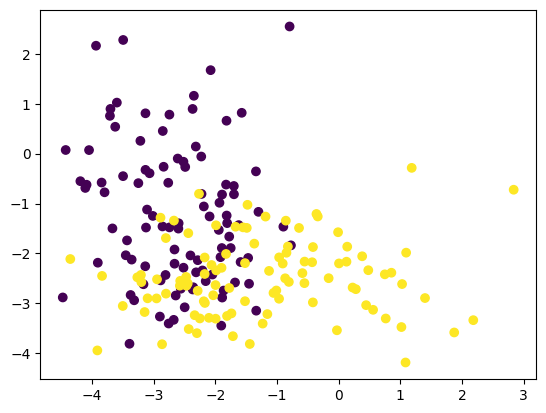

In [ ]:
print("CSP Transformado Shape:", csp_data.shape)
plt.scatter(csp_data[:,0],csp_data[:,1],c=y)
plt.show()

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


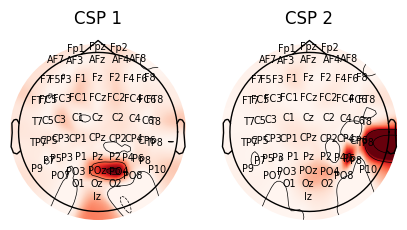

In [ ]:
#EEG original
fig,ax = plt.subplots(1,n_components,figsize=(5,5))
for cc in range(n_components):
    vec_ = np.abs(csp.filters_[cc])
    topoplot(vec_, channels, contours=3, cmap='Reds', names=channels, sensors=False,ax=ax[cc],show=False,vlim=(min(vec_), max(vec_)))
    ax[cc].set_title(f'CSP {cc+1}')


In [ ]:
#lectura de datos
sbj = 16
X, y = load_GIGA(sbj=sbj, **load_args)

f_bank = np.array([[0.5,4.],[4., 8.],[8.,13.],[13.,32.],[32.,100.]])
vwt = np.array([[0.25, 1.75],[1.5,3],[2.75,4.25],[4,5.5],[5.25,6.75]]) #2.5 - 5 MI 0 - 7 trial completo
tf_repr = TimeFrequencyRpr(sfreq = new_fs, f_bank = f_bank,vwt=vwt)
X_ = np.squeeze(tf_repr.transform(X))
X_.shape

Resampling from 512.000000 to 256.000000 Hz.


(199, 64, 384, 5, 5)

In [ ]:
# csp por ventanas y ritmos
# Definir las dimensiones del arreglo
ritmos_ = f_bank.shape[0]
ventanas_ = vwt.shape[0]
n_comp = 2
# Inicializar el arreglo vacío con listas anidadas
csp_M = [[None for _ in range(ventanas_)] for _ in range(ritmos_)]
csp_filters_ = np.zeros((ritmos_,ventanas_,X_.shape[1],X_.shape[1])) #ritmos ventanas Ch
Xcsp_ = np.zeros((X_.shape[0],n_comp,ritmos_,ventanas_))

for i in range(ritmos_):
    for j in range(ventanas_):
        print(f'CSP ritmo {f_bank[i]} -- ventana {vwt[j]}...')
        csp_M[i][j] =  CSP(n_components=n_comp, log= True, transform_into='average_power')
        Xcsp_[:,:,i,j] = csp.fit_transform(X_[:,:,:,j,i].astype(np.float64), y)
        csp_filters_[i,j,:] = np.abs(csp.filters_)

CSP ritmo [0.5 4. ] -- ventana [0.25 1.75]...
CSP ritmo [0.5 4. ] -- ventana [1.5 3. ]...
CSP ritmo [0.5 4. ] -- ventana [2.75 4.25]...
CSP ritmo [0.5 4. ] -- ventana [4.  5.5]...
CSP ritmo [0.5 4. ] -- ventana [5.25 6.75]...
CSP ritmo [4. 8.] -- ventana [0.25 1.75]...
CSP ritmo [4. 8.] -- ventana [1.5 3. ]...
CSP ritmo [4. 8.] -- ventana [2.75 4.25]...
CSP ritmo [4. 8.] -- ventana [4.  5.5]...
CSP ritmo [4. 8.] -- ventana [5.25 6.75]...
CSP ritmo [ 8. 13.] -- ventana [0.25 1.75]...
CSP ritmo [ 8. 13.] -- ventana [1.5 3. ]...
CSP ritmo [ 8. 13.] -- ventana [2.75 4.25]...
CSP ritmo [ 8. 13.] -- ventana [4.  5.5]...
CSP ritmo [ 8. 13.] -- ventana [5.25 6.75]...
CSP ritmo [13. 32.] -- ventana [0.25 1.75]...
CSP ritmo [13. 32.] -- ventana [1.5 3. ]...
CSP ritmo [13. 32.] -- ventana [2.75 4.25]...
CSP ritmo [13. 32.] -- ventana [4.  5.5]...
CSP ritmo [13. 32.] -- ventana [5.25 6.75]...
CSP ritmo [ 32. 100.] -- ventana [0.25 1.75]...
CSP ritmo [ 32. 100.] -- ventana [1.5 3. ]...
CSP ritmo [ 

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


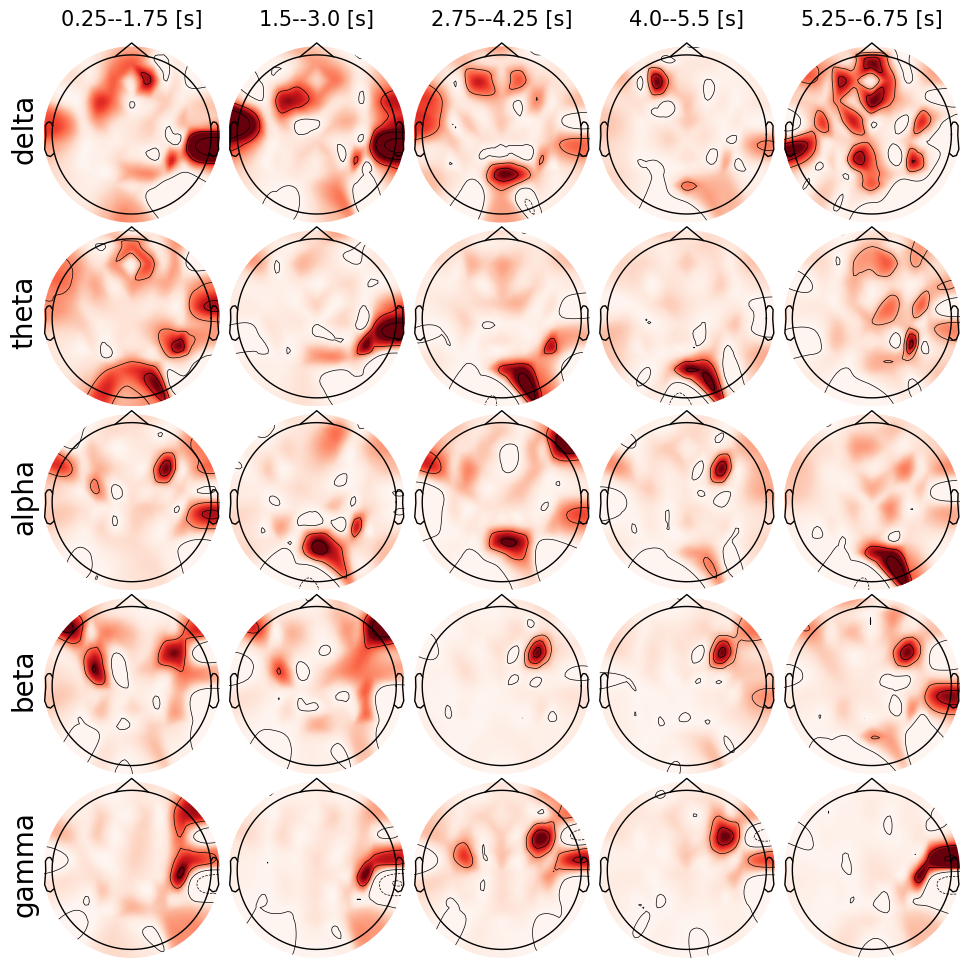

In [ ]:
# graficar topomaps
fig, ax = plt.subplots(ritmos_,ventanas_,figsize=(12,12))

for i in range(ritmos_):
    for j in range(ventanas_):
        vec_ = csp_filters_[i,j,0]
        vec_ = vec_/max(vec_)
        topoplot(vec_, channels, contours=3, cmap='Reds', names=None, sensors=False,ax=ax[i,j],show=False,vlim=(min(vec_), max(vec_)))
    ax[i,0].set_ylabel(ritmo[i],fontsize=20)
for j in range(ventanas_):
     ax[0,j].set_title(f'{vwt[j,0]}--{vwt[j,1]} [s]',fontsize=15)

plt.subplots_adjust(hspace=-0.025,wspace=-0.025)
plt.show()

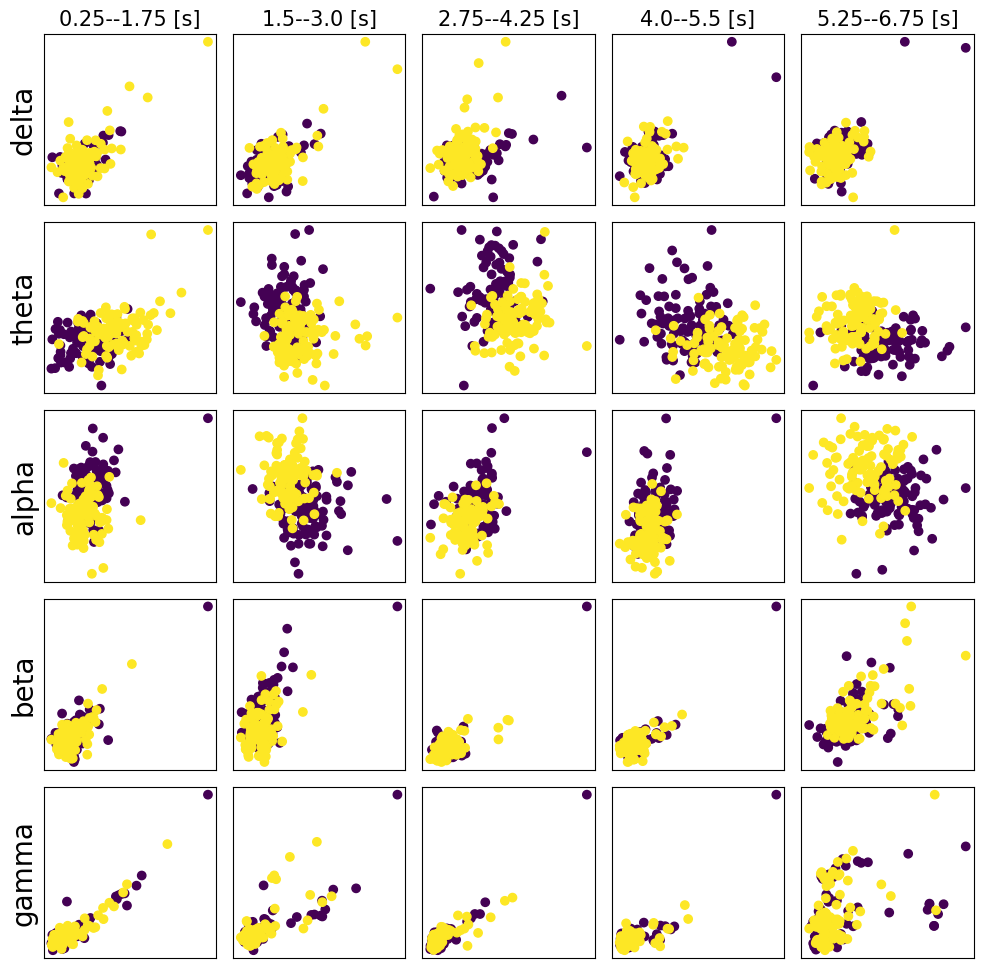

In [ ]:
#scatters
fig, ax = plt.subplots(ritmos_,ventanas_,figsize=(12,12))

for i in range(ritmos_):
    for j in range(ventanas_):
        ax[i,j].scatter(Xcsp_[:,0,i,j],Xcsp_[:,1,i,j],c=y)
        ax[i,j].set_xticks([])
        ax[i,j].set_yticks([])
    ax[i,0].set_ylabel(ritmo[i],fontsize=20)
for j in range(ventanas_):
     ax[0,j].set_title(f'{vwt[j,0]}--{vwt[j,1]} [s]',fontsize=15)

plt.subplots_adjust(hspace=0.1,wspace=0.1)
plt.show()

In [ ]:
# calculamos las matrices de coectividades (correlación)

N = X.shape[0]
connectivities_v = np.array([np.corrcoef(X[i]) for i in range(N)])

print(connectivities_v.shape)

(199, 64, 64)


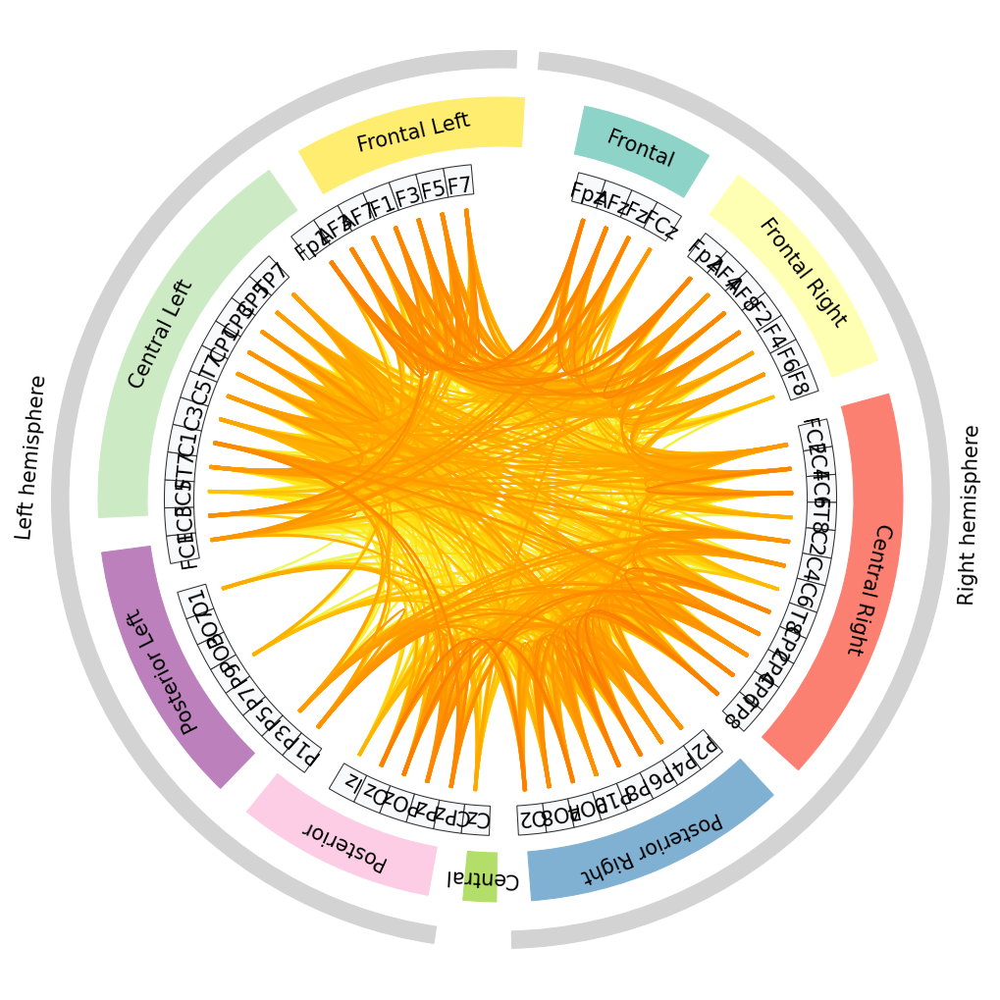

In [ ]:
from gcpds.visualizations.connectivities import CircosConnectivity

N = len(channels)  # channels

areas = {
    'Frontal': ['Fpz', 'AFz', 'Fz', 'FCz'],
    'Frontal Right': ['Fp2','AF4','AF8','F2','F4','F6','F8',],
    'Central Right': ['FC2','FC4','FC6','FT8','C2','C4','C6','T8','CP2','CP4','CP6','TP8',],
    'Posterior Right': ['P2','P4','P6','P8','P10','PO4','PO8','O2',],
    'Central': ['Cz'],
    'Posterior': ['CPz','Pz', 'Cz','POz','Oz','Iz',],
    'Posterior Left': ['P1','P3','P5','P7','P9','PO3','PO7','O1',],
    'Central Left': ['FC1','FC3','FC5','FT7','C1','C3','C5','T7','CP1','CP3','CP5','TP7',],
    'Frontal Left': ['Fp1','AF3','AF7','F1','F3','F5','F7',],
}


conn = CircosConnectivity(
    connectivities_v[0,:,:], channels, areas=areas, threshold=0.7,

    # cmaps and themes
    areas_cmap='Set3',
    arcs_cmap='Wistia',
    hemisphere_color='lightgray',
    channel_color='#f8f9fa',
    min_alpha=0,


    # Texts
    width={'hemispheres':35, 'areas':100, 'channels':60},
    text={'hemispheres':40, 'areas':20,  'channels':40},
    separation={'hemispheres':10, 'areas':-30, 'channels':5},
    labelposition={'hemispheres':60, 'areas':0, 'channels':-10},
    size=10,
    labelsize=15,


    # Shapes
    show_emisphere=True,
    arcs_separation=30,
    connection_width=0.1,
    small_separation=5,
    big_separation=10,
    offset=0,
)

conn.figure;


## Topoplots

En el siguiente código, **se comparan los primeros individuos de la base de datos.**

Los resultados muestran una consistencia en los patrones cerebrales de la imaginación motora, evidenciando estabilidad en la topografía EEG, las bandas de frecuencia y los componentes CSP. Esta uniformidad es clave para desarrollar Interfaces Cerebro-Computadora (BCI) más confiables, permitiendo la identificación de patrones comunes para el control de dispositivos externos.

In [ ]:
# Calcular el promedio de la señal en cada canal

connecitivities_mean = np.mean(connectivities_v[0],axis=1)

Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 1 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 2 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 3 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 4 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 5 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 6 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 7 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 8 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 9 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 10 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 11 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 12 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 13 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 14 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 15 ...
Resampling from 512.00 to 256.00 Hz.
Procesando sujeto 16 ...
Resampling from 5

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


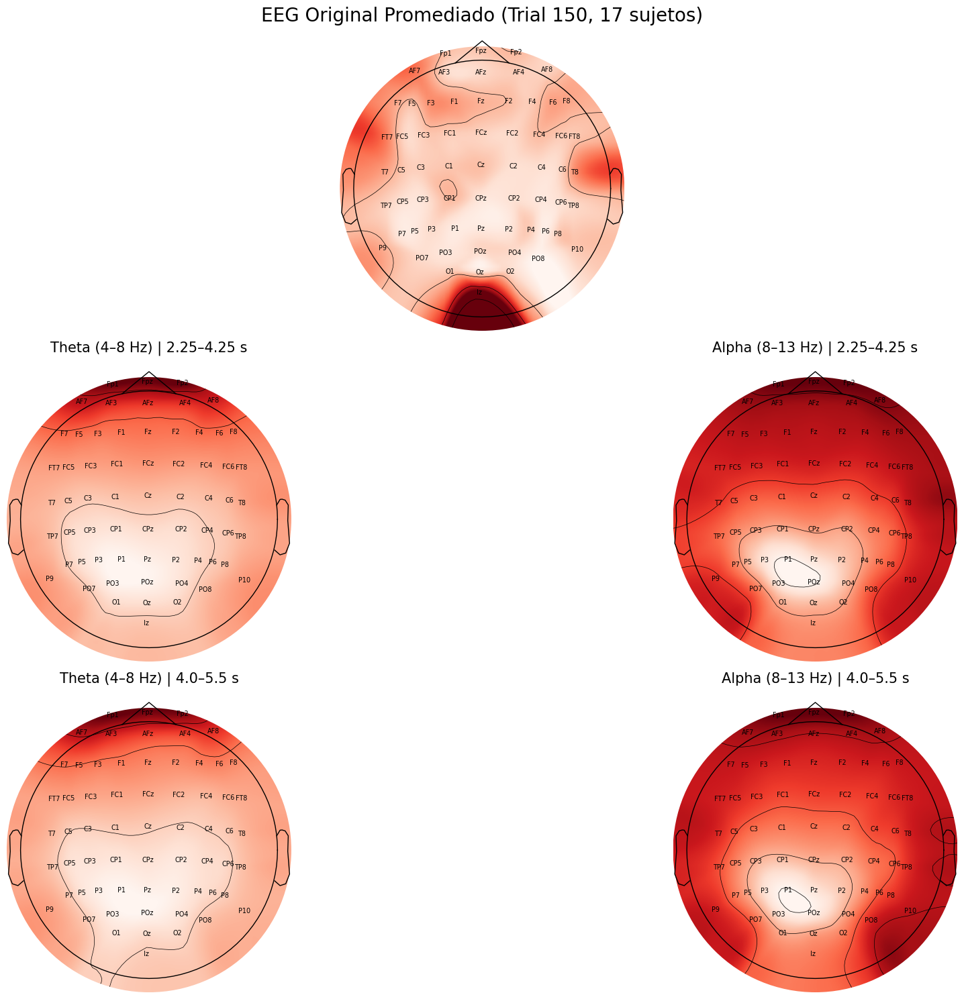

Procesando CSP para sujeto 1 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 2 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 3 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 4 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 5 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 6 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 7 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 8 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 9 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 10 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 11 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 12 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 13 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP para sujeto 14 ...
Resampling from 512.00 to 256.00 Hz.
Procesando CSP 

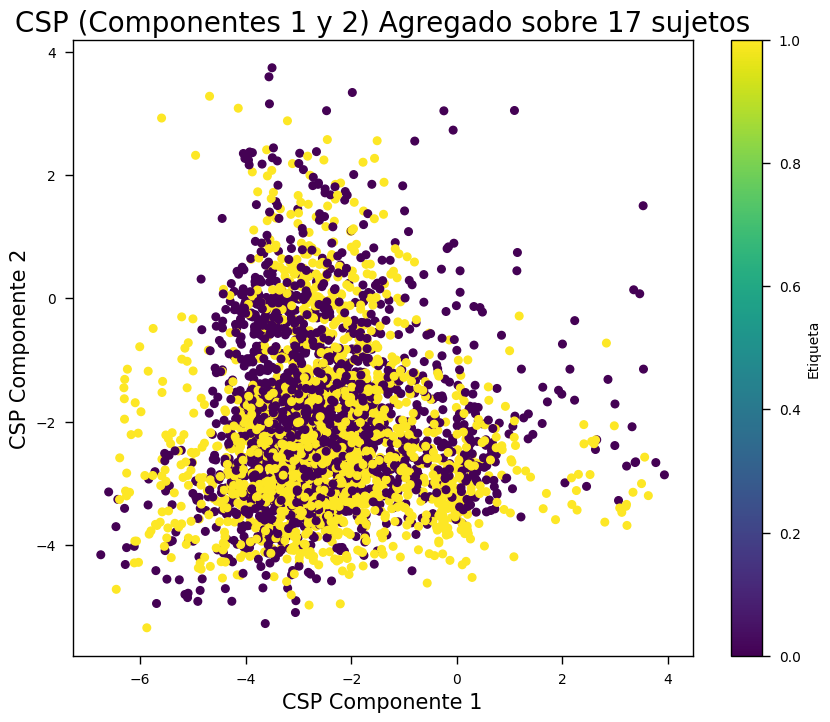

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from gcpds.visualizations.topoplots import topoplot
import mne
from mne.decoding import CSP
from scipy.signal import resample, butter as bw, filtfilt
from sklearn.base import BaseEstimator, TransformerMixin

# CLASE PARA REPRESENTACIÓN TIEMPO-FRECUENCIA DEL EEG

class TimeFrequencyRpr(BaseEstimator, TransformerMixin):
    def __init__(self, sfreq, f_bank=None, vwt=None):
        self.sfreq = sfreq
        self.f_bank = f_bank
        self.vwt = vwt

    def _validation_param(self):
        if self.sfreq <= 0:
            raise ValueError('Non negative sampling frequency is accepted')
        if self.f_bank is None:
            self.flag_f_bank = False
        elif self.f_bank.ndim != 2:
            raise ValueError('Band frequencies have to be a 2D array')
        else:
            self.flag_f_bank = True

        if self.vwt is None:
            self.flag_vwt = False
        elif self.vwt.ndim != 2:
            raise ValueError('Time windows have to be a 2D array')
        else:
            self.flag_vwt = True

    def _filter_bank(self, X):
        # X: (n_trials, n_channels, time_samples)
        X_f = np.zeros((X.shape[0], X.shape[1], X.shape[2], self.f_bank.shape[0]))
        for f in np.arange(self.f_bank.shape[0]):
            X_f[:,:,:,f] = butterworth_digital_filter(X, N=4, Wn=self.f_bank[f],
                                                        btype='bandpass', fs=self.sfreq)
        return X_f

    def _sliding_windows(self, X):
        """
        Extrae ventanas deslizantes de la señal X.
        Entrada X tiene forma (n_trials, n_channels, time_samples).
        Se retorna un array de forma (n_trials, n_channels, max_window_length, n_windows),
        donde cada ventana se rellena con ceros hasta alcanzar la longitud máxima.
        """
        # Calcular la longitud de cada ventana (en muestras)
        window_lengths = [int(self.sfreq * (w[1] - w[0])) for w in self.vwt]
        max_length = max(window_lengths)
        n_trials, n_channels, _ = X.shape
        X_w = np.zeros((n_trials, n_channels, max_length, self.vwt.shape[0]))
        for idx, w in enumerate(self.vwt):
            start = int(self.sfreq * w[0])
            end = int(self.sfreq * w[1])
            window_data = X[:, :, start:end]
            current_length = window_data.shape[2]
            X_w[:, :, :current_length, idx] = window_data
        return X_w

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        self._validation_param()  # Valida los parámetros
        if self.flag_f_bank:
            X_f = self._filter_bank(X)
        else:
            X_f = X[:,:,:,np.newaxis]
        if self.flag_vwt:
            X_wf = []
            for f in range(X_f.shape[3]):
                X_wf.append(self._sliding_windows(X_f[:,:,:,f]))
            #Dado que las ventanas pueden tener diferentes duraciones, se normalizan mediante 'stacking' con ceros para mantener dimensiones uniformes
            X_wf = np.stack(X_wf, axis=-1)
        else:
            X_wf = X_f[:,:,:,np.newaxis,:]
        return X_wf

# FUNCIONES AUXILIARES


def butterworth_digital_filter(X, N, Wn, btype, fs, axis=-1, padtype=None, padlen=0, method='pad', irlen=None):
    b, a = bw(N, Wn, btype, analog=False, output='ba', fs=fs)
    return filtfilt(b, a, X, axis=axis, padtype=padtype, padlen=padlen, method=method, irlen=irlen)

def load_GIGA(db, sbj, eeg_ch_names, new_fs, fs, f_bank=None, vwt=None, run=None):
    index_eeg_chs = db.format_channels_selectors(channels=eeg_ch_names) - 1
    db.load_subject(sbj)
    if run is None:
        X, y = db.get_data(classes=['left hand mi', 'right hand mi'])
    else:
        X, y = db.get_run(run, classes=['left hand mi', 'right hand mi'])
    X = X[:, index_eeg_chs, :]
    if new_fs != fs:
        print("Resampling from {:.2f} to {:.2f} Hz.".format(fs, new_fs))
        X = resample(X, int((X.shape[-1] / fs) * new_fs), axis=-1)
    return X, y


# Definición de canales, áreas y creación de objeto de base de datos


channels = ['Fp1','Fpz','Fp2',
            'AF7','AF3','AFz','AF4','AF8',
            'F7','F5','F3','F1','Fz','F2','F4','F6','F8',
            'FT7','FC5','FC3','FC1','FCz','FC2','FC4','FC6','FT8',
            'T7','C5','C3','C1','Cz','C2','C4','C6','T8',
            'TP7','CP5','CP3','CP1','CPz','CP2','CP4','CP6','TP8',
            'P9','P7','P5','P3','P1','Pz','P2','P4','P6','P8','P10',
            'PO7','PO3','POz','PO4','PO8',
            'O1','Oz','O2',
            'Iz']

areas = {
    'Frontal': ['Fpz', 'AFz', 'Fz', 'FCz'],
    'Frontal Right': ['Fp2','AF4','AF8','F2','F4','F6','F8'],
    'Central Right': ['FC2','FC4','FC6','FT8','C2','C4','C6','T8','CP2','CP4','CP6','TP8'],
    'Posterior Right': ['P2','P4','P6','P8','P10','PO4','PO8','O2'],
    'Posterior': ['CPz','Pz', 'Cz','POz','Oz','Iz'],
    'Posterior Left': ['P1','P3','P5','P7','P9','PO3','PO7','O1'],
    'Central Left': ['FC1','FC3','FC5','FT7','C1','C3','C5','T7','CP1','CP3','CP5','TP7'],
    'Frontal Left': ['Fp1','AF3','AF7','F1','F3','F5','F7'],
}

arcs = ['areas', 'channels']

# Se crea el objeto de base de datos (GIGA_MI_ME) a partir de la ruta en Kaggle
# db = GIGA_MI_ME('/kaggle/input/giga-science-gcpds/GIGA_MI_ME')  # Comenta o descomenta según sea necesario

# Parámetros de muestreo y carga
new_fs = 256.
load_args = dict(
    db=db,
    eeg_ch_names=channels,
    fs=db.metadata['sampling_rate'],
    new_fs=new_fs
)

# Definición de los parámetros para el análisis tiempo-frecuencia del EEG

# Bandas de interés: Theta (4–8 Hz) y Alpha (8–13 Hz)
f_bank = np.array([[4., 8.],
                   [8., 13.]])
# Ventanas temporales: 2.25–4.25 s y 4.0–5.5 s
vwt = np.array([[2.25, 4.25],
                [4.0, 5.5]])

# Actualizar load_args (si es que load_GIGA utiliza estos parámetros)
load_args.update({'f_bank': f_bank, 'vwt': vwt})

# Creación del objeto para análisis tiempo-frecuencia del EEG

tf_repr = TimeFrequencyRpr(sfreq=new_fs, f_bank=f_bank, vwt=vwt)


# Cálculo de mapas topográficos promediados a partir de múltiples ensayos


# Cargar el primer sujeto para conocer el número de canales
X0, y0 = load_GIGA(**load_args, sbj=1)
n_channels = X0.shape[1]

# Acumuladores:
acc_topo_orig = np.zeros(n_channels)  # EEG original
# Para TF se acumulan las topografías: dimensiones [n_ventanas, n_bandas, n_channels]
acc_topo_tf = np.zeros((vwt.shape[0], f_bank.shape[0], n_channels))
subject_count = 0

# Seleccionar el trial de interés
trial = 150
n_subjects = 17  # Cambiado a 17 sujetos

for sbj in range(1, n_subjects+1):
    print(f"Procesando sujeto {sbj} ...")
    X, y = load_GIGA(**load_args, sbj=sbj)

    # Filtrar los datos para incluir solo los segmentos de imaginación motora
    motor_imagery_indices = np.where((y == 0) | (y == 1))[0]  # Asumiendo que 0 y 1 son las etiquetas de imaginación motora
    X_mi = X[motor_imagery_indices]
    y_mi = y[motor_imagery_indices]

    # EEG original: promedia el valor absoluto a lo largo del tiempo
    vec_orig = np.abs(X_mi[trial, :, :]).mean(axis=-1)
    acc_topo_orig += vec_orig

    # Obtener representación tiempo-frecuencia; se espera forma:
    # (n_trials, n_channels, max_window_length, n_ventanas, n_fbank)
    X_tf = tf_repr.transform(X_mi)

    # Para cada ventana y banda, extraer la topografía
    for win_idx in range(vwt.shape[0]):
        # Calcular la longitud real de la ventana en muestras
        actual_length = int(new_fs * (vwt[win_idx, 1] - vwt[win_idx, 0]))
        for band_idx in range(f_bank.shape[0]):
            # Promediar solo sobre la parte activa de la ventana
            vec_tf = np.abs(X_tf[trial, :, :actual_length, win_idx, band_idx]).mean(axis=1)
            acc_topo_tf[win_idx, band_idx, :] += vec_tf

    subject_count += 1

# Promediar sobre los sujetos
avg_topo_orig = acc_topo_orig / subject_count
avg_topo_tf = acc_topo_tf / subject_count

# Graficar Topoplots

fig = plt.figure(figsize=(20, 15))
gs = gridspec.GridSpec(3, 2)

# EEG original promediado
ax_orig = fig.add_subplot(gs[0, :])
topoplot(avg_topo_orig, channels=channels, contours=3, cmap='infierno',
         names=channels, sensors=False, ax=ax_orig,
         show=False, vlim=(np.min(avg_topo_orig), np.max(avg_topo_orig)))
ax_orig.set_title(f'EEG Original Promediado (Trial {trial}, {n_subjects} sujetos)', fontsize=20)

# Generación de mapas topográficos según ventanas de tiempo y bandas de frecuencia
for win_idx in range(vwt.shape[0]):
    for band_idx in range(f_bank.shape[0]):
        ax = fig.add_subplot(gs[1 + win_idx, band_idx])
        topo_vec = avg_topo_tf[win_idx, band_idx, :]
        topoplot(topo_vec, channels=channels, contours=3, cmap='Reds',
                 names=channels, sensors=False, ax=ax,
                 show=False, vlim=(np.min(topo_vec), np.max(topo_vec)))
        band_label = ["Theta (4–8 Hz)", "Alpha (8–13 Hz)"][band_idx]
        ax.set_title(f'{band_label} | {vwt[win_idx, 0]}–{vwt[win_idx, 1]} s', fontsize=15)

plt.tight_layout()
plt.show()


# Proyección de señales EEG en componentes espaciales discriminativos con CSP

n_components = 2
all_csp_data = []
all_labels = []

for sbj in range(1, n_subjects+1):
    print(f"Procesando CSP para sujeto {sbj} ...")
    X, y = load_GIGA(**load_args, sbj=sbj)

    # Extraer los datos EEG de las clases relacionadas con imaginación motora
    motor_imagery_indices = np.where((y == 0) | (y == 1))[0]
    X_mi = X[motor_imagery_indices]
    y_mi = y[motor_imagery_indices]

    csp = CSP(n_components=n_components, log=True, transform_into='average_power')
    csp_data = csp.fit_transform(X_mi.astype(np.float64), y_mi)
    all_csp_data.append(csp_data)
    all_labels.append(y_mi)

all_csp_data = np.concatenate(all_csp_data, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

plt.figure(figsize=(10, 8))
sc = plt.scatter(all_csp_data[:, 0], all_csp_data[:, 1],
                 c=all_labels, cmap='plasma', s=30)
plt.xlabel('CSP Componente 1', fontsize=15)
plt.ylabel('CSP Componente 2', fontsize=15)
plt.title(f'CSP (Componentes 1 y 2) Agregado sobre {n_subjects} sujetos', fontsize=20)
plt.colorbar(sc, label='Etiqueta')
plt.show()